# XGBoost to predict discharge disability
### Using all features, with a 5-fold cross validation, using the model trained in notebook 010: a multiclass classification model to give the probability (likelihood) that each patient is in each discharge disability class (mRS 0, 1, 2, 3, 4, 5 or 6)

Examine the consistency of the patterns that the model identifies across 5 k-folds, specifically in terms of feature importance and SHAP.

### Plain English summary

Before look at feature selection, let's look at the performance of a model trained on all of the data, using k-fold splits to analyse the consistency of the results for different data divisions.

### Model and data
XGBoost
All the features

### Aims
Are the patterns that the model detects dependent on the data divisions in the k-fold splits?

### Observations
Patterns detected by the model are pretty consistent across the k-fold splits.
Confidence to do our analysis of SHAP values on a single kfold split. Removes the issue of accounting for different SHAP base values across the different kfold models.

Feature importance (as calcualted by XGBoost) is only returned for the model (as a whole) and not per output category.
The one hot encoded stroke team features dominate the list of 25 most importance features (22 of the top 25 are stroke teams). Here are the important features (omitting the one hot encoded stroke teams):
prior_disability, stroke_severity, nihss_arrival_loc, age, thrombolysis_no_but_improving, nihss_arrival_best_gaze, any_afib_diagnosis, scan_to_thrombolysis_time, year, nihss_arrival_motor_arm_left


#### Further work
Look at the difference of the SHAP for a single patient across the 5 k-fold splits.

#### Resources
Using code from https://github.com/samuel-book/samuel_shap_paper_1/blob/main/xgb_10_features/02b_xgb_combined_fit_accuracy_key_features_separate_k_fold.ipynb

and https://github.com/samuel-book/samuel_shap_paper_1/blob/main/xgb_10_features/03_xgb_combined_shap_key_features.ipynb

(code orignially from 01a_xgb_kfold_all_features_accuracy_importance_shap.ipynb and 01_xgb_5fold_all_features_accuracy_importance_shap.ipynb)

## Import libraries

In [1]:
# Turn warnings off to keep notebook tidy
import warnings
warnings.filterwarnings("ignore")

import os
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd

import scipy

from xgboost import XGBClassifier
from sklearn.metrics import auc
from sklearn.metrics import roc_curve

import json

from dataclasses import dataclass

import seaborn as sns

from sklearn.metrics import roc_auc_score

from sklearn.metrics import confusion_matrix

import pickle
import shap

from os.path import exists

import math

import importlib
# Import local package
#from utils import waterfall
## Force package to be reloaded
#importlib.reload(waterfall);

# Need for cm subplots?
#from mpl_toolkits.axes_grid1 import make_axes_locatable
#from matplotlib.colors import LogNorm
#from matplotlib.ticker import MultipleLocator

import time

Report the time duration to run notebook

In [2]:
start_time = time.time()

Choose number of kfolds (either =1 for the first kfold, or =5 for the full 5 kfold split)

In [3]:
n_kfold = 5

## Set up paths and filenames

Use os.path.join() to create filenames. So define folders without trailing forward slash, and include all characters in file names.

In [25]:
@dataclass(frozen=True)
class Paths:
    '''Singleton object for storing paths to data and database.'''
    output_save_path: str = './output/'
    model_save_path: str = './saved_models/'
    data_read_path: str = '../data_processing/output/kfold_5fold'
    model_text: str = f'xgb_all_features_{n_kfold}fold'
    notebook: str = '011_'

paths = Paths()

Create output folders if needed

In [5]:
path = paths.output_save_path
if not os.path.exists(path):
    os.makedirs(path)
        
path = paths.model_save_path
if not os.path.exists(path):
    os.makedirs(path)

Some features need to be removed from the dataset (those that are duplicates). Define a function to do this.

In [6]:
def drop_columns(df, cols):
    for col in cols:
        if col in df.columns: df.drop([col],axis=1,inplace=True)
    return(df)

Specify the columns to remove

In [7]:
cols_remove = ['id','stroke_team_id']

## Import data

Data has previously been split into 5 stratified k-fold splits. Read these in.

In [8]:
train_data_kfold, test_data_kfold = [], []

for k in range(n_kfold):
    # Read in training set, restrict to chosen features, rename titles, & store
    filename = os.path.join(paths.data_read_path, 
                            ('03_train_' + str(k) + '.csv'))
    train = pd.read_csv(filename)
#    train.rename(columns=dict_feature_name, inplace=True)
    train = drop_columns(train, cols_remove)
    train_data_kfold.append(train)

    filename = os.path.join(paths.data_read_path, 
                            ('03_test_' + str(k) + '.csv'))
    test = pd.read_csv(filename)
#    test.rename(columns=dict_feature_name, inplace=True)
    test = drop_columns(test, cols_remove)
    test_data_kfold.append(test)

Select the features for the model

In [9]:
selected_features = list(train_data_kfold[0])
selected_features.remove('discharge_disability')
n_features = len(selected_features)
selected_features.append('discharge_disability')

Limit dataset to selected features (in this case, we are keeping all the available features, the previous cell may specify otherwise for another purpose)

In [10]:
for k in range(n_kfold):
    train = train_data_kfold[k]
    train = train[selected_features]
    train_data_kfold[k] = train

    test = test_data_kfold[k]
    test = test[selected_features]
    test_data_kfold[k] = test

Store the output classes

In [11]:
class_names = train_data_kfold[0]['discharge_disability'].unique()
class_names = np.sort(class_names)
n_classes = len(class_names)

Take copy of stroke team to use to create a histogram (before this feature is converted into a one hot encoded feature)

In [12]:
test_stroke_team_kfold = (
                 [test_data_kfold[k]["stroke_team"] for k in range(n_kfold)])

### One hot the categorical features

Convert some categorical features to one hot encoded features.

Define a function

In [13]:
def convert_feature_to_one_hot(df, feature_name, prefix):
    """
    df [dataframe]: training or test dataset
    feature_name [str]: feature to convert to ont hot encoding
    prefix [str]: string to use on new feature
    """

    # One hot encode a feature
    df_feature = pd.get_dummies(
        df[feature_name], prefix = prefix)
    df = pd.concat([df, df_feature], axis=1)
    df.drop(feature_name, axis=1, inplace=True)

    return(df)

Set up two lists for the one hot encoding. 

A list of the feature names that are categorical and to be converted using one hot encoding.
A list of the prefixes to use for these features.

In [14]:
features_to_one_hot = ["stroke_team", "weekday"]
list_prefix = ["team", "weekday"]

For each feature in the list, for each train and test dataset, convert to one hot encoded.

In [15]:
for feature, prefix in zip(features_to_one_hot, list_prefix):
    if feature in selected_features:
        for k in range(n_kfold):
            train_data_kfold[k] = (
                            convert_feature_to_one_hot(train_data_kfold[k], 
                                                       feature, prefix))
            test_data_kfold[k] = (
                            convert_feature_to_one_hot(test_data_kfold[k], 
                                                       feature, prefix))

Feature names with one hot encoding

In [16]:
features_ohe = list(train_data_kfold[0])
features_ohe.remove("discharge_disability")
n_features = len(features_ohe)

In [17]:
print(f"There are {len(selected_features)} original features "
      f"(before one-hot encoding)")
print(f"There are {n_features} features (after one-hot encoding)")

There are 55 original features (before one-hot encoding)
There are 177 features (after one-hot encoding)


## Load XGBoost model

Load the model from notebook 010 that was trained on all features.

Create function to return X and y data for train and test sets

In [18]:
def get_x_y_data(train, test, target):
    """
    Pass data from the split and return the dataframes with the target in one 
    dataframe (X), and dependent features in another (y)
    
    train (dataframe): dataframe containing training instances 
    test (dataframe): dataframe containing test instances
    target (string): column name of the targert feature (the column to separate from the two dataframes)
    """    

    # Get X and y
    X_train = train.drop(target, axis=1)
    X_test = test.drop(target, axis=1)
    y_train = train[target]
    y_test = test[target]

    return(X_train, X_test, y_train, y_test)

Create function to return SHAP values extension X and y data for train and test sets

In [19]:
def calculate_shap_extended(model, k, X_train, X_test):
    """
    TreeExplainer is a fast and exact method to estimate SHAP values for tree 
    models and ensembles of trees. Using this we can calculate the SHAP values.

    Either load from pickle (if file exists), or calculate.

    model (xgboost object):
    k: kfold number
    X_train: training set (used as background data)
    X_test: test set (to calculate the SHAP values for)

    return the extended shap values (contains .values, .base, and .data)
        
    """

    # Set filename
    filename = os.path.join(paths.output_save_path, 
                            (paths.notebook + paths.model_text + 
                             '_shap_values_extended_' + str(k) + '.p'))
    # Check if exists
    file_exists = exists(filename)

    if file_exists:
        # Load explainer
        with open(filename, 'rb') as filehandler:
            shap_values_extended = pickle.load(filehandler)
    else:
        # Calculate SHAP values
        
        # Set up explainer using the model and feature values from training set
        explainer = shap.TreeExplainer(model, X_train)

        # Get (and store) Shapley values along with base and feature values
        shap_values_extended = explainer(X_test)

        explainer_filename = os.path.join(paths.output_save_path, 
                            (paths.notebook + paths.model_text + 
                             '_shap_explainer_' + str(k) + '.p'))

        # Save explainer using pickle
        with open(explainer_filename, 'wb') as filehandler:
            pickle.dump(explainer, filehandler)
            
        # Save shap values extended using pickle
        with open(filename, 'wb') as filehandler:
            pickle.dump(shap_values_extended, filehandler)
        
    return(shap_values_extended)

In [23]:
# Initiate lists
r_square_kfold = []
roc_auc_ovr_kfold = []
accuracy_kfold = []
error_within_one_kfold = []
feature_importance_kfold = []
y_probs_kfold = []
y_pred_kfold = []
model_kfold = []
shap_values_extended_kfold = []
shap_values_kfold = []

# Loop through k folds
for k in range(n_kfold):

    # Get k fold split
    (X_train, X_test, y_train, y_test) = get_x_y_data(train_data_kfold[k],
                                                      test_data_kfold[k],
                                                      'discharge_disability')

    # Model filename
    filename = os.path.join(paths.model_save_path, 
                            ('010_' + paths.model_text + '_' + str(k) + '.p'))

    # Check if exists
    file_exists = exists(filename)

    if file_exists:
    # Load models
        with open(filename, 'rb') as filehandler:
            model = pickle.load(filehandler)
            model_kfold.append(model)        
    else:
        print('Run notebook 010 first. Using the model that was trained there')
    # Get target categories from model
    
    classes = model.classes_

    # Get and store predicted probabilities
    y_probs = model.predict_proba(X_test)
    y_probs_kfold.append(y_probs)

    # Get and store predicted class
    y_pred = model.predict(X_test)
    y_pred_kfold.append(y_pred)

    # Calculate ROC AUC for multiclass models, using One vs Rest
    roc_auc_ovr = roc_auc_score(y_test, y_probs, labels = classes, 
                                multi_class = 'ovr', average = 'macro')
    roc_auc_ovr_kfold.append(roc_auc_ovr)

    # Calculate error
    y_error = y_test - y_pred
    accuracy = np.mean(y_error==0)
    accuracy_kfold.append(accuracy)

    error_within_one = np.mean(np.abs(y_error)<=1)
    error_within_one_kfold.append(error_within_one)

    # Get and store feature importances
    feature_importance = model.feature_importances_
    feature_importance_kfold.append(feature_importance)

    # Get and store SHAP values
    shap_values_extended_kfold.append(calculate_shap_extended(model, k, 
                                                              X_train, X_test))
    shap_values_kfold.append(shap_values_extended_kfold[k].values)

    # Print progress
    print (f'Completed {k+1} of {n_kfold}')

accuracy_mean = np.mean(accuracy_kfold)
error_within_one_mean = np.mean(error_within_one_kfold)

print (f'All features, accuracy: {accuracy_mean:0.3f} '
       f'(std across {n_kfold} kfolds: {np.std(accuracy_kfold):0.3f})')

print (f'All features, accuracy within one: {error_within_one_mean:0.3f} '
       f'(std across {n_kfold} kfolds: {np.std(error_within_one_kfold):0.3f})')

Run notebook 010 first. Using the model that was trained there


NameError: name 'model' is not defined

In [24]:
filename

'./saved_models/010_xgb_all_features_{n_kfold}fold_0.p'

## Section 1: Feature contribution

### Section 1.1: Feature Importances

https://stackoverflow.com/questions/58603632/how-to-get-feature-importance-for-each-class-in-mutliclass-classification-with-x)

The XGBoost algorithm provides a metrc per feature called "feature importance". It does not provide this value with respect ot the output class, just a single value for the whole model. We can analyse the feature importance values in the same way as if it is a binary classification model.

Examine the consitency of feature importances across k-fold splits.

A model is fitted to each k-fold split, and feature importance values are obtained for each model (but not for each output class). 

This next section assesses the range of feature importance values for each feature across the k-fold splits.

Create (and show) a dataframe that stores the min, median, and max feature importance value for each feature across the 5 k-fold splits

In [ ]:
df_feature_importance = pd.DataFrame(index=features_ohe)

# For each k-fold
for k in range(n_kfold):
    # feature importance value for each k-fold split
    df_feature_importance[f'{k}'] = feature_importance_kfold[k]

# Calcualte descriptive stats of the feature importance (across the 5 k-folds)
# Store in DataFrame
df_feature_importance['importance (mean)'] = (
                    np.array(feature_importance_kfold).mean(axis = 0))
df_feature_importance['importance (std dev)'] = (
                    np.array(feature_importance_kfold).std(axis = 0))
df_feature_importance['importance (min)'] = (
                    np.array(feature_importance_kfold).min(axis = 0))
df_feature_importance['importance (median)'] = (
                    np.median(np.array(feature_importance_kfold),axis=0))
df_feature_importance['importance (max)'] = (
                    np.array(feature_importance_kfold).max(axis = 0))


# Sort by importance (weight)
df_feature_importance.sort_values(by='importance (median)', 
                                  ascending=False, inplace=True)

# Save
filename = os.path.join(paths.output_save_path, 
                        (paths.notebook + paths.model_text + 
                         '_feature_importance.csv'))
df_feature_importance.to_csv(filename)

# Display top 25
df_feature_importance.head(15)

,0,1,2,3,4,importance (mean),importance (std dev),importance (min),importance (median),importance (max)
prior_disability,0.051673,0.051322,0.051281,0.051868,0.050763,0.051381,0.000379,0.050763,0.051322,0.051868
stroke_severity,0.033296,0.033745,0.034139,0.031911,0.032366,0.033091,0.000835,0.031911,0.033296,0.034139
team_Royal Stoke University Hospital,0.031565,0.027287,0.028657,0.028753,0.030924,0.029437,0.001577,0.027287,0.028753,0.031565
team_Salford Royal Hospital,0.018028,0.018523,0.017763,0.019008,0.021378,0.018940,0.001291,0.017763,0.018523,0.021378
team_University Hospital of North Durham,0.016359,0.013957,0.015379,0.017348,0.016239,0.015856,0.001137,0.013957,0.016239,0.017348
nihss_arrival_loc,0.015482,0.015848,0.017575,0.015704,0.017496,0.016421,0.000918,0.015482,0.015848,0.017575
team_Royal Hallamshire Hospital,0.013517,0.012524,0.014760,0.013480,0.011869,0.013230,0.000984,0.011869,0.013480,0.014760
team_Sandwell District Hospital,0.013207,0.012571,0.013496,0.014332,0.013463,0.013414,0.000567,0.012571,0.013463,0.014332
team_Leicester Royal Infirmary,0.014044,0.013022,0.013353,0.013537,0.013160,0.013423,0.000356,0.013022,0.013353,0.014044
team_Ysbyty Gwynedd,0.012557,0.012462,0.012505,0.012552,0.011788,0.012373,0.000294,0.011788,0.012505,0.012557


Graph of % stroke team for the top n features

Text(0, 0.5, 'Ranked features that are a stroke team one hot encoded feature (%)')

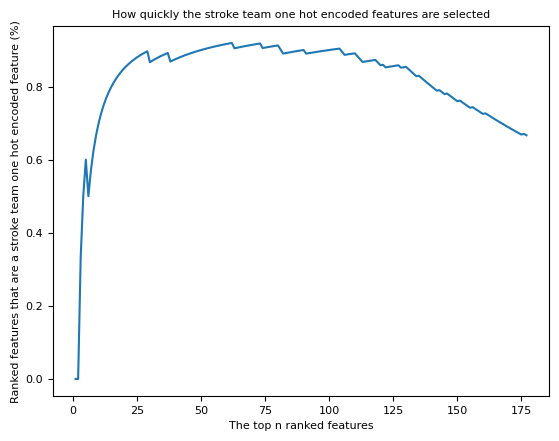

In [ ]:
# Create a mask for feature names that don't contain string "team"
mask_exclude_team = ['team' not in i for i in list(df_feature_importance.index)]
mask_team = ['team' in i for i in list(df_feature_importance.index)]

list_pc_team_feature = [sum(mask_team[:i+1])/(i+1) for i in range(n_features)]

plt.plot(list(range(1, (n_features + 1),1)), list_pc_team_feature)
plt.title('How quickly the stroke team one hot encoded features are selected')
plt.xlabel('The top n ranked features')
plt.ylabel('Ranked features that are a stroke team one hot encoded feature (%)')

filename = os.path.join(paths.output_save_path, 
                        (paths.notebook + paths.model_text + 
                         '_percent_team_ohe_features_ranked_importance.jpg'))
plt.savefig(filename, dpi=300)

In [ ]:
# Use a mask for feature names that don't contain string "team"
df_feature_importance[mask_exclude_team].head(15)

,0,1,2,3,4,importance (mean),importance (std dev),importance (min),importance (median),importance (max)
prior_disability,0.051673,0.051322,0.051281,0.051868,0.050763,0.051381,0.000379,0.050763,0.051322,0.051868
stroke_severity,0.033296,0.033745,0.034139,0.031911,0.032366,0.033091,0.000835,0.031911,0.033296,0.034139
nihss_arrival_loc,0.015482,0.015848,0.017575,0.015704,0.017496,0.016421,0.000918,0.015482,0.015848,0.017575
age,0.007618,0.007600,0.007485,0.007441,0.007538,0.007536,0.000067,0.007441,0.007538,0.007618
thrombolysis_no_but_improving,0.006956,0.007308,0.006151,0.006473,0.006707,0.006719,0.000397,0.006151,0.006707,0.007308
nihss_arrival_best_gaze,0.005324,0.005185,0.004790,0.004980,0.005133,0.005083,0.000183,0.004790,0.005133,0.005324
any_afib_diagnosis,0.004590,0.004653,0.004230,0.004590,0.004630,0.004539,0.000156,0.004230,0.004590,0.004653
year,0.004446,0.004342,0.004354,0.004136,0.004199,0.004295,0.000113,0.004136,0.004342,0.004446
scan_to_thrombolysis_time,0.004342,0.004175,0.004274,0.004366,0.004465,0.004324,0.000096,0.004175,0.004342,0.004465
nihss_arrival_motor_arm_left,0.004136,0.004335,0.004103,0.004132,0.004256,0.004192,0.000089,0.004103,0.004136,0.004335


Create a violin plot for the top 25 features with the highest feature importance values.

Shows the distribution of the feature importance values for each feature across the 5 kfold splits (the shaded area show the density of the data points).

The same data in each plot, the right one excludes the stroke team one hot encoded features.

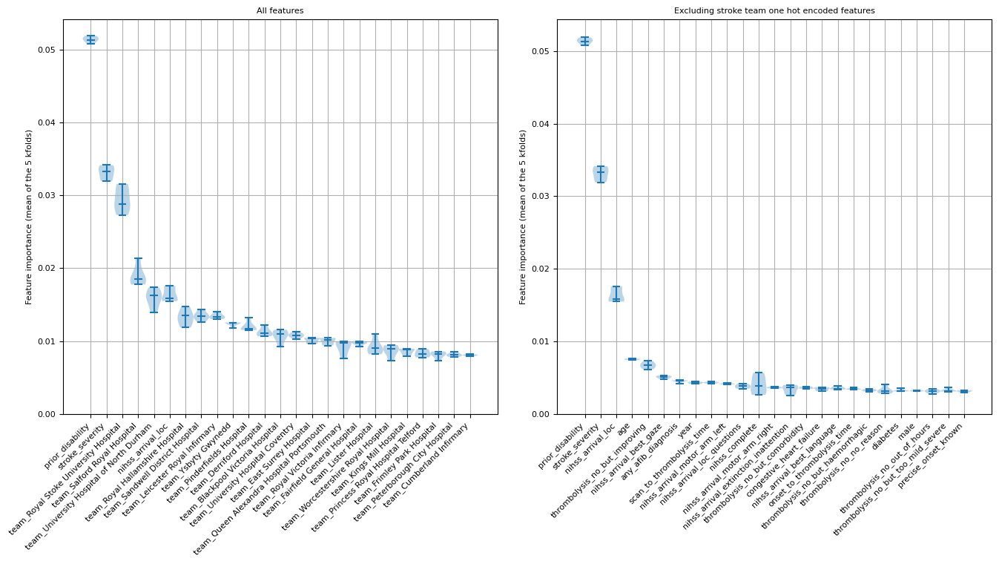

In [ ]:
# Number of ranked features to show in plot
n_features_show = 25

# Set plot width based on number of features to show
width = 14 * (n_features_show/25)

# Set up figure
fig = plt.figure(figsize=(width,8))

# Create list of kfold indices
cols = [str(i) for i in range(n_kfold)]

# Set up first mask to include all features, and second mask to exclude stroke team
list_mask = [[True] * n_features, mask_exclude_team]
list_title = ['All features', 'Excluding stroke team one hot encoded features']

for subplot in range(2):
    features_show = (list(df_feature_importance[list_mask[subplot]].head(n_features_show).index))

    ax1 = fig.add_subplot(1,2,subplot+1)

    ax1.violinplot(df_feature_importance[cols].loc[features_show].T,
                   showmedians=True, widths=1, showextrema=False)
    ax1.set_ylim(0)
    ax1.set_xticks(np.arange(1, len(features_show) + 1))
    ax1.set_xticklabels(features_show, rotation=45, ha='right')
    ax1.grid(which='both')
    ax1.set_ylabel('Feature importance (mean of the 5 kfolds)')
    ax1.set_title(list_title[subplot])

plt.tight_layout()

filename = (
    os.path.join(paths.output_save_path, 
                 (paths.notebook + paths.model_text + '_importance_violin.jpg'))

plt.savefig(filename, dpi=300, bbox_inches='tight', pad_inches=0.2)
plt.show()


## Section 1.2: SHAP values
SHAP values give the contribution that each feature has on the models prediction, per instance. A SHAP value is returned for each feature, for each instance, for each of the 7 output classes. We can analyse the SHAP values in a different way than if it was a binary model.

We will use the shap library: https://shap.readthedocs.io/en/latest/index.html

'Raw' SHAP values from XGBoost model are log odds ratios. A SHAP value is returned for each feature, for each instance, for each model (one per k-fold)

#### Get average SHAP values for each k-fold

For each k-fold split, calculate the mean SHAP value for each feature (across all instances), for each of the 7 disability discharge output values. 

The mean is calculated in three ways:

1. mean of raw values
2. mean of absolute values
3. absolute of mean of raw values


In a separate dataframe (df_mean_abs_shap), store the mean of the absolute SHAP values for each kfold, and also the min, median and max across the 5 kfolds (a row per feature). A dataframe per output class.

In [ ]:
# Initialise dictionary. Key name is output_class. Holds a list for dataframes
# for that class (for each kfold). The dataframe has a row per feature and a 
# column for the average SHAP values across all of the instances
dict_mean_abs_shap = {}
dict_list_of_df = {}

# For each output class
for c in range(n_classes):

    ## Initialise empty lists
    shap_values_mean_kfold = []
    # Initialise DataFrame (stores mean of the absolute SHAP values for each kfold)
    df_mean_abs_shap = pd.DataFrame()

    # For each k-fold split
    for k in range(n_kfold):
        # Calculate mean SHAP value for each feature (across all instances), for
        # this class
        shap_values = shap_values_kfold[k][:,:,c]
        df = pd.DataFrame(index=features_ohe)
        df['mean_shap'] = np.mean(shap_values, axis=0)
        df['abs_mean_shap'] = np.abs(df['mean_shap'])
        df['mean_abs_shap'] = np.mean(np.abs(shap_values), axis=0)
        df['rank'] = df['mean_abs_shap'].rank(ascending=False).values
        df.sort_index()
        shap_values_mean_kfold.append(df)

        # Store the mean of the absolute SHAP values in a dataframe (column for 
        # each k-fold split). 
        # Add more columns to this dataframe
        df_mean_abs_shap[f'{k}'] = df['mean_abs_shap']

    # For this class, df_mean_abs_shap has a column per kfold, row per feature, 
    # stores the mean of the absolute SHAP values across all instances.
    # Dictionary has a keyname per class, each storing a list of dataframes 
    # (a dataframe per kfold)
    dict_list_of_df[f'class{c}'] = shap_values_mean_kfold

    # Dictionary has a keyname per class, each storing a dataframe with a column 
    # per kfold (the mean of the absolute SHAPS across the instances). 

    # Create list of kfold indices
    cols = [str(i) for i in range(n_kfold)]
    
    df_mean_abs_shap['min'] = df_mean_abs_shap[cols].min(axis=1)
    df_mean_abs_shap['median'] = df_mean_abs_shap[cols].median(axis=1) 
    df_mean_abs_shap['max'] = df_mean_abs_shap[cols].max(axis=1)
    # Order features by their median value of the mean across the instances of their absolute SHAP
    df_mean_abs_shap.sort_values('median', inplace=True, ascending=False)


    # The 3 columns (min, median, max) that were in df_mean_abs_shap_summary are now in df_mean_abs_shap
    # Store the dataframe for this class (row per feature, column per kfold (and summary statistics) for SHAPs across all instances)
    dict_mean_abs_shap[f'class{c}'] = df_mean_abs_shap

For each output class, identify the 15 features with the highest SHAP values (in terms of the median of the kfolds of the mean of the absolute SHAP values) and create a violin plot.

Violin plots show the distribution of the shap values for each feature across the 5 kfold splits (the shaded area show the density of the data points).

The same data in each plot, the right one excludes the stroke team one hot encoded features.

# QUESTION - WHY NO TEAM FEATURE IN THE TOP 10 SHAP? HAVE THEY BEEN FILTERED (DOESN'T APPEAR TO BE) - OTHERWISE WHAT RANKED OURDER ARE THEY, AS THEY DOMINATED THE FEATURE IMPORTANCE RANKINGS?

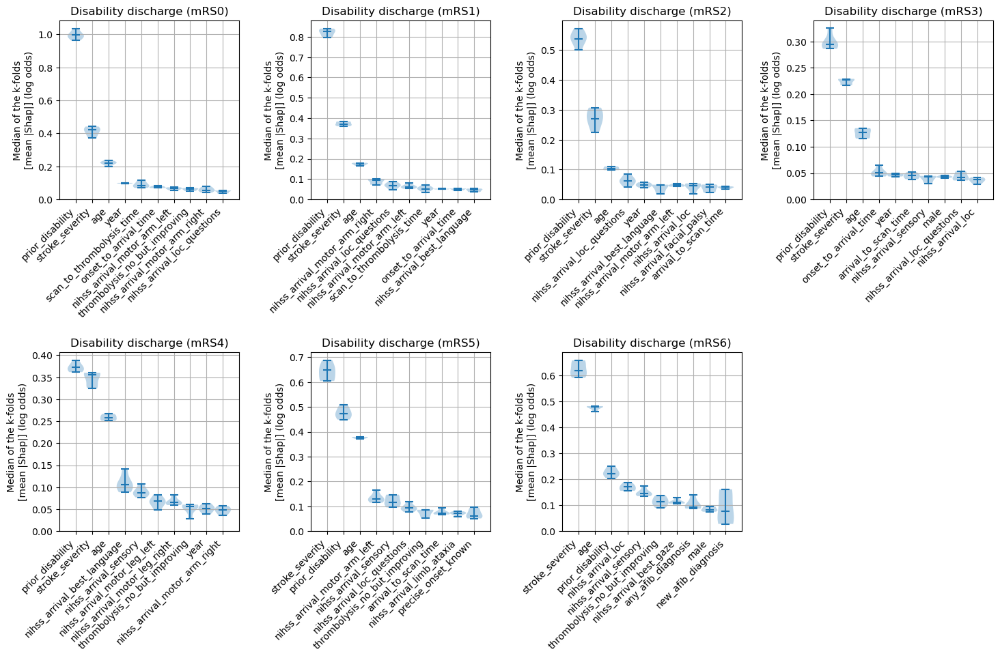

In [ ]:
n_features_show = 15

width = 15 * (n_features_show/10)

fig = plt.figure(figsize=(width, 10))

for c in range(n_classes):
    # Data for the violin plot (for this class)
    df_mean_abs_shap = dict_mean_abs_shap[f'class{c}']

    # Create list of kfold indices
    cols = [str(i) for i in range(n_kfold)]
               
    ax1 = fig.add_subplot(2,4,c+1)
    ax1.violinplot(df_mean_abs_shap[cols].iloc[:n_features_show].T,
                   showmedians=True, widths=1)
    ax1.set_ylim(0)
    ax1.set_title(f'Disability discharge (mRS{c})')
    labels = df_mean_abs_shap.index[:n_features_show]
    ax1.set_xticks(np.arange(1, len(labels) + 1))
    ax1.set_xticklabels(labels, rotation=45, ha='right')
    ax1.grid(which='both')
    ax1.set_ylabel('Median of the {n_kfold} k-folds\n[mean |Shap|] (log odds)')

plt.subplots_adjust(bottom=0.25, wspace=0.05)
    
plt.tight_layout(pad=2)

filename = os.path.join(paths.output_save_path, 
                        (paths.notebook + paths.model_text + '_shap_violin.jpg'))

plt.savefig(filename, dpi=300, bbox_inches='tight', pad_inches=0.2)
plt.show()

## Section 1.3: Compare top 10 SHAP and feature importance values

Compare the features (and their values) that make the top 10 when selected by either SHAP values, or feature importance values.

In [ ]:
df_compare_shap_importance = pd.DataFrame()
df_compare_shap_importance['Importance (feature name)'] = \
                            df_feature_importance.index
df_compare_shap_importance['Importance (median value)'] = \
                            df_feature_importance['importance (median)'].values

for c in range(n_classes):
    # Data for the violin plot (for this class)
    df_compare_shap_importance[f'SHAP (feature name) [mRS{c}]'] = (
                            dict_mean_abs_shap[f'class{c}'].index)
    df_compare_shap_importance[f'SHAP (median value) [mRS{c}]'] = (
                            dict_mean_abs_shap[f'class{c}']['median'].values)
               
df_compare_shap_importance.head(10)

,Importance (feature name),Importance (median value),SHAP (feature name) [mRS0],SHAP (median value) [mRS0],SHAP (feature name) [mRS1],SHAP (median value) [mRS1],SHAP (feature name) [mRS2],SHAP (median value) [mRS2],SHAP (feature name) [mRS3],SHAP (median value) [mRS3],SHAP (feature name) [mRS4],SHAP (median value) [mRS4],SHAP (feature name) [mRS5],SHAP (median value) [mRS5],SHAP (feature name) [mRS6],SHAP (median value) [mRS6]
0,prior_disability,0.051322,prior_disability,0.995467,prior_disability,0.826726,prior_disability,0.537522,prior_disability,0.294922,prior_disability,0.372869,stroke_severity,0.647590,stroke_severity,0.619638
1,stroke_severity,0.033296,stroke_severity,0.423297,stroke_severity,0.370079,stroke_severity,0.270905,stroke_severity,0.226925,stroke_severity,0.355639,prior_disability,0.473616,age,0.479207
2,team_Royal Stoke University Hospital,0.028753,age,0.221144,age,0.176290,age,0.103329,age,0.126866,age,0.258474,age,0.375730,prior_disability,0.222741
3,team_Salford Royal Hospital,0.018523,year,0.098176,nihss_arrival_motor_arm_right,0.094123,nihss_arrival_loc_questions,0.062629,onset_to_arrival_time,0.050168,nihss_arrival_best_language,0.105690,nihss_arrival_motor_arm_left,0.129463,nihss_arrival_loc,0.170667
4,team_University Hospital of North Durham,0.016239,scan_to_thrombolysis_time,0.082588,nihss_arrival_loc_questions,0.067799,year,0.047708,year,0.046577,nihss_arrival_sensory,0.086716,nihss_arrival_sensory,0.114874,nihss_arrival_sensory,0.144125
5,nihss_arrival_loc,0.015848,onset_to_arrival_time,0.073675,nihss_arrival_motor_arm_left,0.061252,nihss_arrival_best_language,0.047587,arrival_to_scan_time,0.045996,nihss_arrival_motor_leg_left,0.068361,nihss_arrival_loc_questions,0.093363,thrombolysis_no_but_improving,0.112921
6,team_Royal Hallamshire Hospital,0.013480,nihss_arrival_motor_arm_left,0.065484,scan_to_thrombolysis_time,0.052136,nihss_arrival_motor_arm_left,0.047402,nihss_arrival_sensory,0.043416,nihss_arrival_motor_leg_right,0.065811,thrombolysis_no_but_improving,0.084743,nihss_arrival_best_gaze,0.111300
7,team_Sandwell District Hospital,0.013463,thrombolysis_no_but_improving,0.062967,year,0.050982,nihss_arrival_loc,0.045790,male,0.042635,thrombolysis_no_but_improving,0.055434,arrival_to_scan_time,0.073010,any_afib_diagnosis,0.093886
8,team_Leicester Royal Infirmary,0.013353,nihss_arrival_motor_arm_right,0.053917,onset_to_arrival_time,0.050864,nihss_arrival_facial_palsy,0.041023,nihss_arrival_loc_questions,0.041119,year,0.052078,nihss_arrival_limb_ataxia,0.071492,male,0.081809
9,team_Ysbyty Gwynedd,0.012505,nihss_arrival_loc_questions,0.051892,nihss_arrival_best_language,0.047302,arrival_to_scan_time,0.040698,nihss_arrival_loc,0.037353,nihss_arrival_motor_arm_right,0.048655,precise_onset_known,0.061601,new_afib_diagnosis,0.075954


Plot all of the features, showing feature importance vs SHAP values.

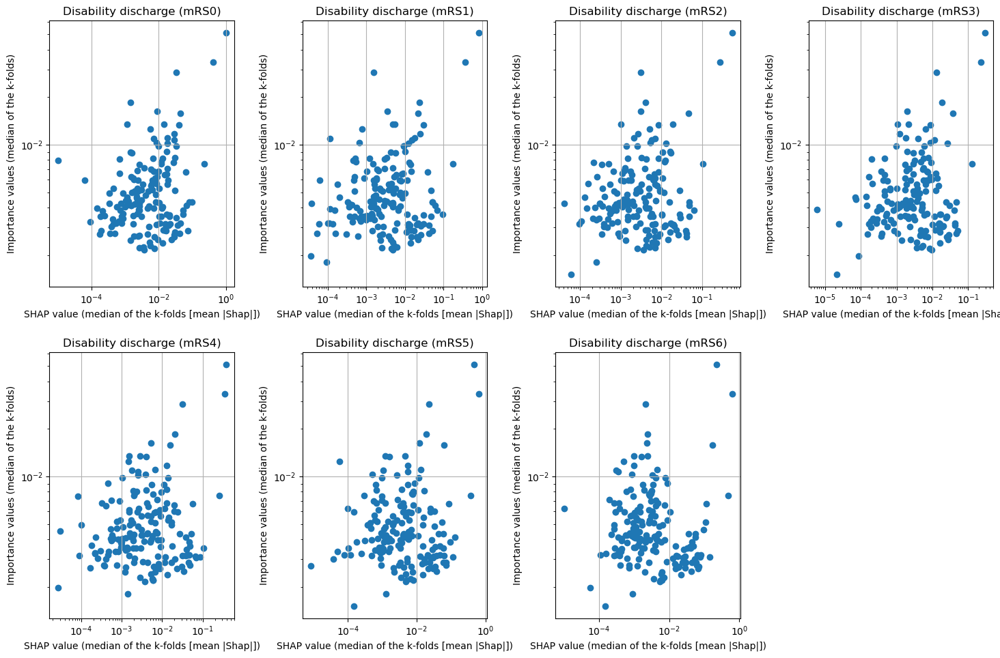

In [ ]:
fig = plt.figure(figsize=(15, 10))

for c in range(n_classes):
    # Data for the violin plot (for this class)
    df_mean_abs_shap = dict_mean_abs_shap[f'class{c}']
    

    df_shap_importance = pd.DataFrame()
    df_shap_importance['Shap'] =  df_mean_abs_shap['median']
    df_shap_importance = df_shap_importance.merge(
                        df_feature_importance['importance (median)'], 
                        left_index=True, right_index=True)
    df_shap_importance.rename(columns={'importance (median)': 'Importance'}, 
                              inplace=True)
    df_shap_importance.sort_values('Shap', inplace=True, ascending=False)

    ax1 = fig.add_subplot(2,4,c+1)
    ax1.scatter(df_shap_importance['Shap'], df_shap_importance['Importance'], 
                c='k', marker='s', s=1)
    ax1.set_title(f'Disability discharge (mRS{c})')
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.set_xlabel('SHAP value (median of the k-folds [mean |Shap|])')
    ax1.set_ylabel('Importance values (median of the k-folds)')
    ax1.grid()

plt.subplots_adjust(bottom=0.25, wspace=0.05)

plt.tight_layout(pad=2)

filename = os.path.join(paths.output_save_path, 
                        (paths.notebook + paths.model_text + 
                         '_shap_importance_correlation.jpg'))

plt.savefig(filename, dpi=300)
plt.show()


Show summary SHAP plot for each kfold.

Shows the mean absolute SHAP for each feature for each class output.

In [ ]:
for k in range(n_kfold):
    # Initialise empty list
    shap_values_list = []
    # Putting the SHAP values in the required format
    for c in range(n_classes):
        shap_values_list.append(shap_values_kfold[k][:,:,c])

    # Get k fold split
    (X_train, X_test, y_train, y_test) = get_x_y_data(train_data_kfold[k],
                                                      test_data_kfold[k],
                                                      'discharge_disability')

    # Plot a SHAP summary plot, one for each k-fold
    shap.summary_plot(shap_values_list, X_test.values, plot_type="bar", 
                      class_names=model.classes_, 
                      feature_names = X_test.columns, class_inds="original",
                      show=False, plot_size=(6,6))
    plt.title(f"K-fold {k+1}")
    plt.tight_layout()
    plt.show()

# (KP MAKE THIS WROK FROM 230623)
Delve a little deeper.

We've looked at the level of contribution each feature has on determining if a patient has a specific disability at discharge. Here we us dependence plots to look at patterns between the features (feature values and SHAP values) for each output class.

Each subplot contains a matrix of these features, showing the relationship between the SHAP value and feature value of one feature, while displaying the feature values of another feature. Each figure contains information for each output class - so we can observe how these patterns change depending on which output class are predicting.

We create a matrix of dependence plots (a plot per feature), and so we need to limit the number of features that we can include so that the visualisation is understandable.

We will include four features (informed by the importance results above): prior disability, age, str severity and onset to thrombolysis time.

This is to show an example of the type of visualisation that we can use to understand patterns that the model has identified. This is for a single kfold.

In [ ]:
features_to_show = ["prior_disability", "age", "stroke_severity", 
                    "onset_to_thrombolysis_time"]

k = 0

# Create a matrix of subplots per class. Each showing the relationship between
# each combination of features on the SHAP value.
for c in range(n_classes):

    # setup matrix of subplots
    fig, axes = plt.subplots(nrows=n_features_show,
                             ncols=n_features_show)
    axes = axes.ravel()

    # Set overall title
    fig.suptitle(f'Class {model.classes_[c]}', fontsize=30)

    # Initialise subplot counter
    count = 0

    # Loop through the features to display
    for i in range(len(features_to_show)):
        # Loop through the features to display
        for j in range(len(features_to_show)):
            # Create the plot. Pass the axes
            shap.dependence_plot(ind=features_to_show[i], 
                                interaction_index=features_to_show[j], 
                                shap_values=shap_values_kfold[k][:,:,c], 
                                features=X_test.values, 
                                feature_names=X_test.columns,
                                show=False, ax=axes[count],
                                alpha=0.1)#, dot_size=2)
            # reduce the dot size/transparancy to reveal dense vs sparse areas
            #https://slundberg.github.io/shap/notebooks/plots/dependence_plot.html
            
            # Add line as shap=0
            axes[count].plot([-1, X_test[features_ohe[i]].max()+1],
                             [0,0],c='0.5')
            
            # Increase subplot counter
            count+=1
    
    # Change font size for each subplot
    for ax in axes:
        ax.set_xlabel(ax.get_xlabel(), fontsize=15)
        ax.set_ylabel(ax.get_ylabel(), fontsize=15)
        ax.tick_params(axis='both',which='major',labelsize=15)

    # Visual propoerties of figure
    dimension = 5 * 5
    fig.set_figheight(dimension)
    fig.set_figwidth(dimension)
    fig.tight_layout(pad=2)
    plt.show()

Can also choose one of these feature combinations and focus on seeing how the patterns change across the classes (as to do so from teh above plot requires a lot of scrolling and memory of the patterns seen in the other classes)

In [ ]:
k = 0
ranked_feature = 0

(X_train, X_test, y_train, y_test) = get_x_y_data(train_data_kfold[k],
                                                test_data_kfold[k],
                                                'discharge_disability')
for c in range(n_classes):
    shap_values = shap_values_kfold[k][:,:,c]
    shap.dependence_plot(ranked_feature, shap_values, X_test.values, 
                     feature_names=X_test.columns)

Can also check pattern across k-folds for a class

In [ ]:
c = 0
ranked_feature = 0

for k in range(n_kfold):
    (X_train, X_test, y_train, y_test) = get_x_y_data(train_data_kfold[k],
                                                    test_data_kfold[k],
                                                    'discharge_disability')
    shap_values = shap_values_kfold[k][:,:,c]
    shap.dependence_plot(ranked_feature, shap_values, X_test.values, 
                     feature_names=X_test.columns)

Think this shows the first few features in the order they appear, whereas lets specify the features want to be included.

Not sure how much information I take form these plots (To remind what expect, figure has got x axis "Shap interaction", and a bunch of subplots of red and blue dots.)

In [ ]:
for k in range(n_kfold):
    # Initialise empty list
    shap_values_list = []
    # Putting the SHAP values in the required format
    for c in range(n_classes):
        shap_values_list.append(shap_values_kfold[k][:,:,c])

    # Get k fold split
    (X_train, X_test, y_train, y_test) = get_x_y_data(train_data_kfold[k],
                                                      test_data_kfold[k],
                                                      'discharge_disability')

    # Plot a SHAP summary plot, one for each k-fold
    shap.summary_plot(shap_values_kfold[k], X_test.values, plot_type="bar", 
                  class_names= class_names, feature_names = X_test.columns, 
                  show=False, plot_size=(6,6))
    
    #plt.title(f"K-fold {k+1}")
    plt.tight_layout()
    plt.show()  

You can also see the summary_plot of a specific class.

Loop through the classes, looking at just the one kfold.

shap_values_kfold[kfold][instance, feature, class]

## TODO: Try and group together the figures that are the same class across the different kfolds.

In [ ]:
for c in range(len(class_names)):
    for k in range(5):
        # Get k fold split
        (X_train, X_test, y_train, y_test) = get_x_y_data(train_data_kfold[k],
                                                        test_data_kfold[k],
                                                        'discharge_disability')

        shap.summary_plot(shap_values_kfold[k][:,:,c], X_test.values, 
                        feature_names=X_test.columns, show=False, 
                        plot_size=(12,5))

        plt.title(f"Class {c}, K-fold {k+1}")
        plt.tight_layout()
        plt.show()

Violin plots show the relationship between feature value and SHAP value for all of the features Output descriptive text to use in the paper to describe the differences a feature value had on the likelihood of receiving thromboylsis.

Resource: https://towardsdatascience.com/binning-records-on-a-continuous-variable-with-pandas-cut-and-qcut-5d7c8e11d7b0 https://matplotlib.org/3.1.0/gallery/statistics/customized_violin.html

In [ ]:
def set_ax(ax, category_list, feat, rotation=0):
    '''
    ax [matplotlib axis object] = matplotlib axis object
    category_list [list] = used for the xtick labels (the grouping of the data)
    feat [string] = used in the axis label, the feature that is being plotted
    rotation [integer] = xtick label rotation

    reeturn [matplotlib axis object]
    
    resource: 
    https://matplotlib.org/3.1.0/gallery/statistics/customized_violin.html
    '''
    # Set the axes ranges and axes labels
    ax.get_xaxis().set_tick_params(direction='out')
    ax.xaxis.set_ticks_position('bottom')
    ax.set_xticks(np.arange(1, len(category_list) + 1))
    ax.set_xticklabels(category_list, rotation=rotation, fontsize=7)
    ax.set_xlim(0.25, len(category_list) + 0.75)
    ax.set_ylabel(f'SHAP values for {feat}', fontsize=12)
    ax.set_xlabel(f'Feature values for {feat}', fontsize=12)
    return(ax)

In [ ]:
def create_grid_of_violin_plots(features_violin, 
                                class_category,
                                shap_values_extended
                                ):
    # Feature Age needs special consideration. It needs the x ticks to be created,
    # as the other features with over 50 unique values, but age is already grouped 
    # for the model (into 5yr groups) and so is treated as the other type.

    # Create figure
    fig = plt.figure(figsize=(12,14), constrained_layout=True)


    fig.suptitle(f'Model to predict discharge disability mRS = {class_category}', fontsize=20)

    # A subplot showing violin plot for each feature.
    # First prepare the fature data for the violin plot: if feature has more than 
    # 50 unique values then assume it needs to be binned (a violin for each bin)

    # Determine number of rows of subplots by rounding up
    ncols = 2
    nrows = math.ceil(len(features_violin)/ncols)

    # Through each feature
    for n, feat in enumerate(features_violin):    
        
        # Get data and SHAP values
        feature_data = shap_values_extended[:, feat, class_category].data
        feature_shap = shap_values_extended[:, feat, class_category].values

        # If feature has more that 50 unique values, then assume it needs to be 
        # binned (otherwise assume they are unique categories)

        if np.unique(feature_data).shape[0] > 50:
            # bin the data, create a violin per bin
            
            # settings for the plot
            rotation = 45
            step = 30
            n_bins = min(11, np.int((feature_data.max())/step))
            
            # create list of bin values
            bin_list = [(i*step) for i in range(n_bins)]
            bin_list.append(feature_data.max())
            if feat == "onset_to_thrombolysis_time":
                # for -100 for no IVT
                bin_list.insert(0, feature_data.min())

            # Number of instances per bin
            #counts, edges, plot = plt.hist(feature_data, bins=bin_list)
            counts, edges = np.histogram(feature_data, bins=bin_list, density=False)

            # create list of bins (the unique categories)
            category_list = [f'{i*step}-{((i+1)*step-1)}\n[n={int(counts[i+1])}]' for i in range(n_bins-1)]
            category_list.append(f'{(n_bins-1)*step}+\n[n={int(counts[-1])}]')
            if feat == "onset_to_thrombolysis_time":
                # for -100 for no IVT
                category_list.insert(0, f'Not receive IVT\n[n={int(counts[0])}]')

            # bin the feature data
            feature_data = pd.cut(feature_data, bin_list, labels=category_list, 
                                right=False)

            # create a list, each entry contains the corresponsing SHAP value for that 
            # category (or bin). A violin will represent each list.    
            shap_per_category = []
            for category in category_list:
                mask = feature_data == category
                shap_per_category.append(feature_shap[mask])

        else:
            # create a violin per unique value
            
            # settings for the plot
            rotation = 90
            
            # create list of unique categories in the feature data
            category_list = np.unique(feature_data)

            # Age needs to keep its decimal value (midpoint between 5 yrs)
            if feat != 'age':
                category_list = [int(i) for i in category_list]

            # create a list, each entry contains the corresponsing SHAP value for that 
            # category (or bin). A violin will represent each list.    
            count = []
            shap_per_category = []
            for category in category_list:
                mask = feature_data == category
                shap_per_category.append(feature_shap[mask])
                count.append(mask.sum())
#                if feat == 'stroke_severity':
#                    print(feature_shap[mask].max())

            if feat == 'age':
                # create text of x ticks
                category_list = [f'{int(i-2.5)}-{int(i+2.5)}' for i in category_list]

                # SSNAP dataset had oldest age category as 100-120 (not a 5 yr band as 
                #   the other ages). To accommodate this, if last age category is "110"
                #   then overwrite the label with the correct band (100-120), and not
                #   107-112 as the above code would create.
                if category_list[-1] == '107-112':
                    category_list[-1] = '100-120'
            if feat == 'stroke_severity':
                # not enough space of chart for 2 lines fo x tick labels
                category_list = [f'{category_list[i]} [n={count[i]}]' for i in range(len(category_list))]
            else:
                category_list = [f'{category_list[i]}\n[n={count[i]}]' for i in range(len(category_list))]

        # create violin plot
        ax = fig.add_subplot(nrows,ncols,n+1)

        ax.violinplot(shap_per_category, showmeans=True, widths=0.9, 
                      showextrema=False)

        # Add line at Shap = 0
        feature_values = shap_values_extended[:, feat].data
        ax.plot([0, len(feature_values)], [0,0],c='0.5')   

        # customise the axes
        ax = set_ax(ax, category_list, feat, rotation=rotation)
        plt.subplots_adjust(bottom=0.15, wspace=0.05)

        # Adjust stroke severity tickmarks
        if feat == 'Stroke severity':
            ax.set_xticks(np.arange(1, len(category_list)+1, 2))
            ax.set_xticklabels(category_list[0::2])   
            
        # Add title
        ax.set_title(feat)
        
    plt.tight_layout(pad=2)
        
    fig.savefig(f'{paths.notebook}_{paths.model_text}_thrombolysis_shap_violin_all_'
                f'features_for_mRS{class_category}.jpg', 
                dpi=300, bbox_inches='tight', pad_inches=0.2)

    plt.show()
    return()

In [ ]:
k = 0
shap_values_extended = shap_values_extended_kfold[k]

# Features to include in the violin plot grid
features_violin = ['prior_disability','stroke_severity',
                   'onset_to_thrombolysis_time','age']

for c in range(n_classes):
    create_grid_of_violin_plots(features_violin, 
                                c,
                                shap_values_extended
                                )

Compare SHAP values for the hospital one-hot encoded features The hospital feature is one-hot encoded, so there is a SHAP value per stroke team. We will use this to create a histogram of the frequency of the SHAP value for the hospital feature (take the mean of the SHAP values for the instances for each hospital's own patients).

In [ ]:
def create_histogram_data_and_plot(test_stroke_team,
                                   shap_values,
                                   features_ohe,
                                   class_category):

    # Set up list for storing patient data and hospital SHAP
    feature_data_with_shap = []

    # Get mean SHAP for stroke team when patient attending that stroke team
    unique_stroketeams_list = list(np.unique(test_stroke_team))
    stroke_team_mean_shap = []
    # Loop through stroke teams
    for stroke_team in unique_stroketeams_list:
        # Identify rows in test data that match each stroke team
        mask = test_stroke_team == stroke_team
        # Extract those rows, for the class
        stroke_team_shap_all_features = shap_values[mask,:,class_category]#shap_values[mask]
        # Get column index for stroke_team_in_shap
        feature_name = 'team_' + stroke_team
        index = features_ohe.index(feature_name)
        # Get SHAP values for hospital
        stroke_team_shap = stroke_team_shap_all_features[:, index]
        # Get mean
        mean_shap = np.mean(stroke_team_shap)
        # Store mean
        stroke_team_mean_shap.append(mean_shap)
        # Get and store feature data and add SHAP
        feature_data = data[mask]
        feature_data['Hospital_SHAP'] = stroke_team_shap
        feature_data_with_shap.append(feature_data)

    # Concatenate and save feature_data_with_shap
    feature_data_with_shap = pd.concat(feature_data_with_shap, axis=0)
    feature_data_with_shap.to_csv(
    f'./{paths.notebook}_{paths.model_text}_feature_data_with_hospital_shap.csv', 
        index=False)

    # Create and save shap mean value per hospital
    hospital_data = pd.DataFrame()
    hospital_data["stroke_team"] = unique_stroketeams_list
    hospital_data["shap_mean"] = stroke_team_mean_shap
    hospital_data.to_csv(
        f'./{paths.notebook}_{paths.model_text}_mean_shap_per_hospital_for_mRS{class_category}.csv', 
        index=False)

    # Plot histogram of the frequency of the mean SHAP value for the instances for each hospital's own patients
    # Use from violin plots
    # facecolor = [0.12156863, 0.46666667, 0.70588235, 0.3]
    # edgecolor= [0.12156863, 0.46666667, 0.70588235, 1.]
    fig = plt.figure(figsize=(12,3))
    ax = fig.add_subplot()

    ax.hist(stroke_team_mean_shap, bins=np.arange(-1.5, 1.5, 0.1), 
            color=[0.12156863, 0.46666667, 0.70588235, 0.3], 
            ec=[0.12156863, 0.46666667, 0.70588235, 1.], 
            linewidth=1.4)
    ax.set_title(f"Outcome for class {class_category}")
    ax.set_xlabel('SHAP values (mean) for hospital attended')
    ax.set_ylabel('Count')
    plt.savefig(f'./{paths.notebook}_{paths.model_text}_hosp_shap_hist.jpg', dpi=300, 
                bbox_inches='tight', pad_inches=0.2)
    plt.show()

    return()

In [ ]:
test_stroke_team = test_stroke_team_kfold[k]

for c in range(n_classes):
    create_histogram_data_and_plot(test_stroke_team,
                                   shap_values,
                                   features_ohe,
                                   c)

# EXTRA CODE YET TO INCLUDE AS THINK IT'S TRYING TO WORK OUT SUBPLOTS FOR SUMMARY_PLOT (WHICH SEEMS TO NOT BE POSSIBLE)

https://towardsdatascience.com/explainable-ai-xai-with-shap-multi-class-classification-problem-64dd30f97cea

https://github.com/Iditc/Posts-on-Medium/blob/main/Explainable%20AI/Explainable%20AI%20(XAI)%20with%20SHAP_MultiClass%20Classification%20Problem.ipynb

https://github.com/slundberg/shap/issues/367


In [ ]:
shap_values_kfold[0].shape

(15363, 168, 7)

In [ ]:
sv = shap_values_kfold[0]
sv = sv.transpose((2,0,1))
sv.shape

(7, 15363, 168)

In [ ]:
shap_values_kfold0_list = shap_values_kfold[0].tolist()

In [ ]:
len(shap_values_kfold0_list[0][0])

7

Making the 3D numpy array (shap_values1) match the list of 7 arrays (shap_values) by creating shap_values1_list, so it can be used in the shap.summary_plot

(took code in cell below from notebook 230614_xgb_all_data_multiclass_shap.ipynb)

shap.summary_plot does not take ax as an argument. So can not put them in a subplot.

# KP QUS DO WE WANT A TEAM ONE AND A NON TEAM ONE? (as n notevook  230623_xgb_all_data_multiclass_shap.ipynb)

Seem to not be able to create a subplot of summary plots. Need to just shoeach plot in turn (rather than have as a more compact layout)

TypeError: summary_legacy() got an unexpected keyword argument 'ax'

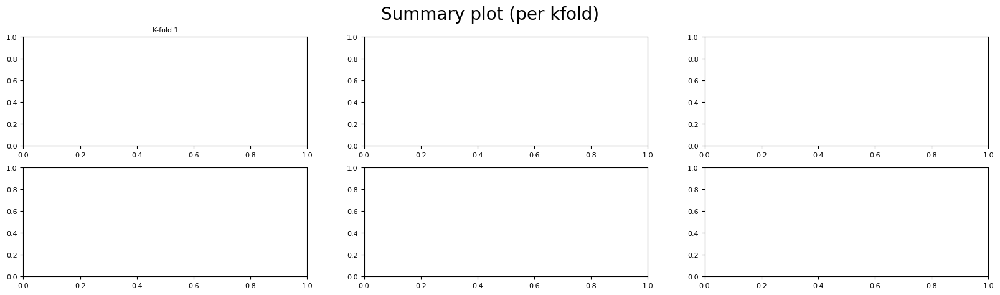

In [ ]:
# Define for the figure
nrows = 2
ncols = 3
# using the variable axs for multiple Axes
fig, axs = plt.subplots(nrows=nrows, ncols=ncols,figsize=(15, 10))


# Define for the figure
fig.suptitle('Summary plot (per kfold)', fontsize=20)
fig.set_size_inches(20,5)
shrink = 0.5


row = 0
col = 0

# Loop through the kfolds, subplot per kfold
for k in range(n_kfold):
     # Get axes
    ax = axs[row,col]
    # Set axis title
    ax.set_title(f'K-fold {k+1}')

    # Initialise empty list
    shap_values_list = []
    # Putting the SHAP values in the required format
    for c in range(n_classes):
        shap_values_list.append(shap_values_kfold[k][:,:,c])

    # Get k fold split
    (X_train, X_test, y_train, y_test) = get_x_y_data(train_data_kfold[k],
                                                      test_data_kfold[k],
                                                      'discharge_disability')

    # Plot a SHAP summary plot, one for each k-fold
    ax = shap.summary_plot(shap_values_list, X_test.values, plot_type="bar", 
                           class_names=model.classes_, show=False,
                           feature_names = X_test.columns, class_inds="original")

    col += 1
    if col == ncols: 
        col = 0
        row += 1

plt.tight_layout()
# Make space for title
plt.subplots_adjust(top=1)


filename = os.path.join(paths.output_save_path, 
                        (paths.notebook + paths.model_text + 
                         '_shap_summary_plot_per_kfold.jpg'))

plt.savefig(filename, dpi=300)

plt.show()

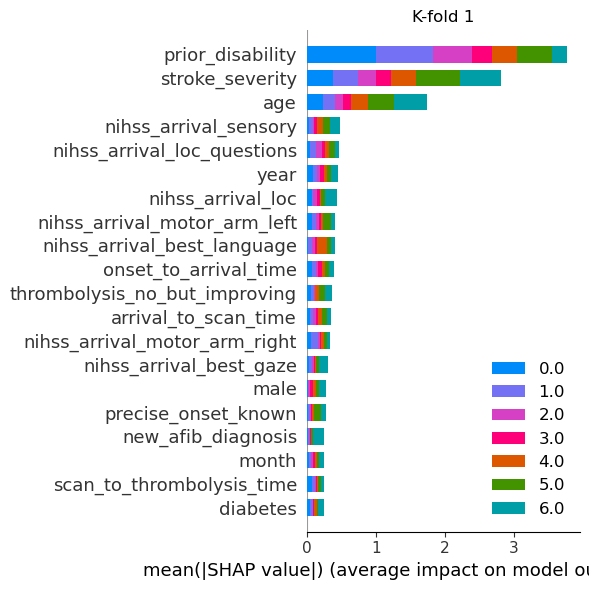

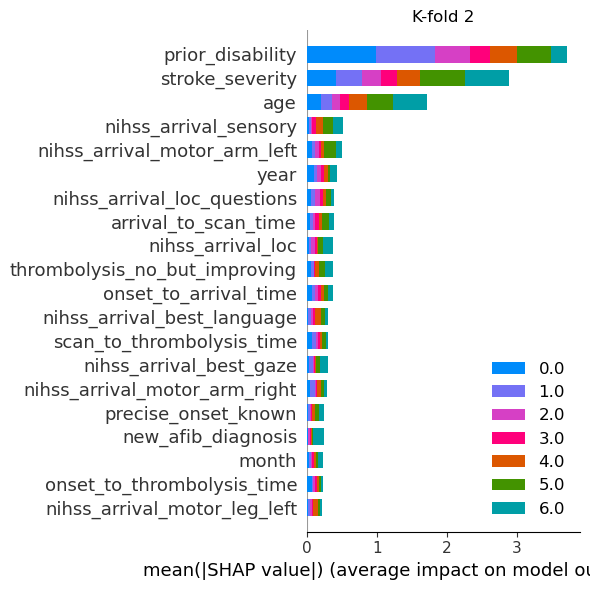

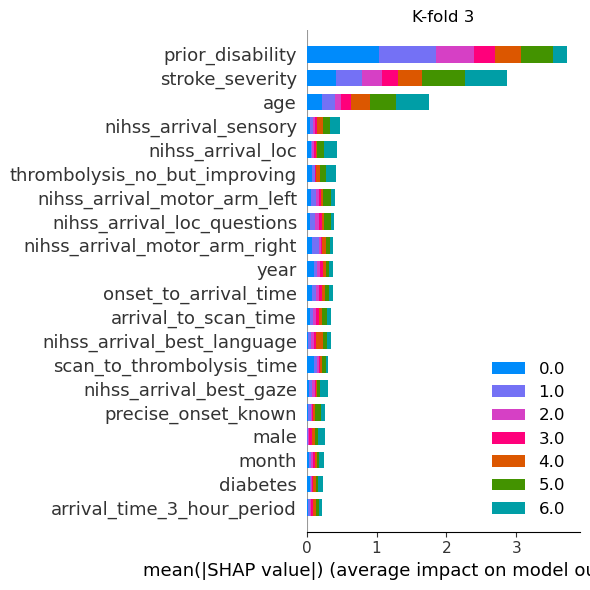

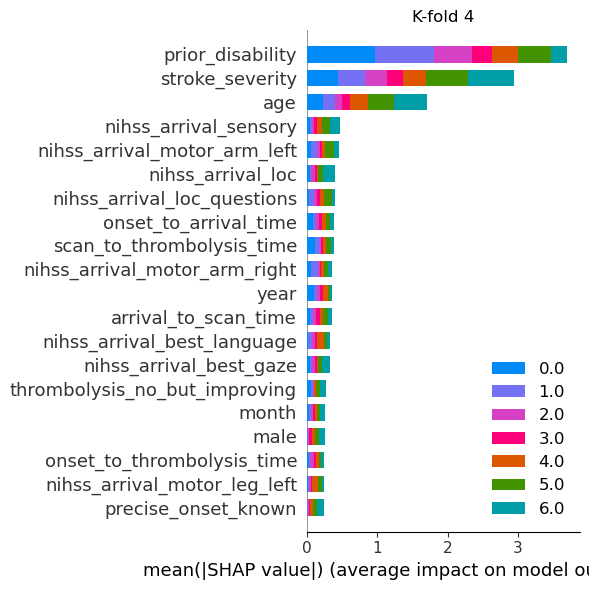

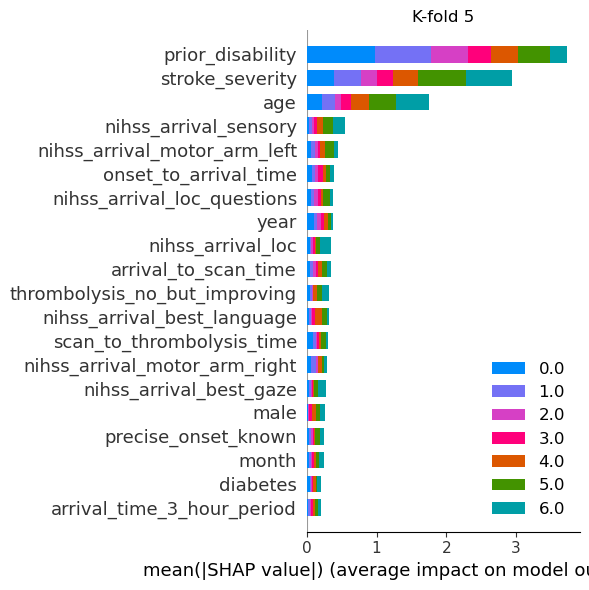

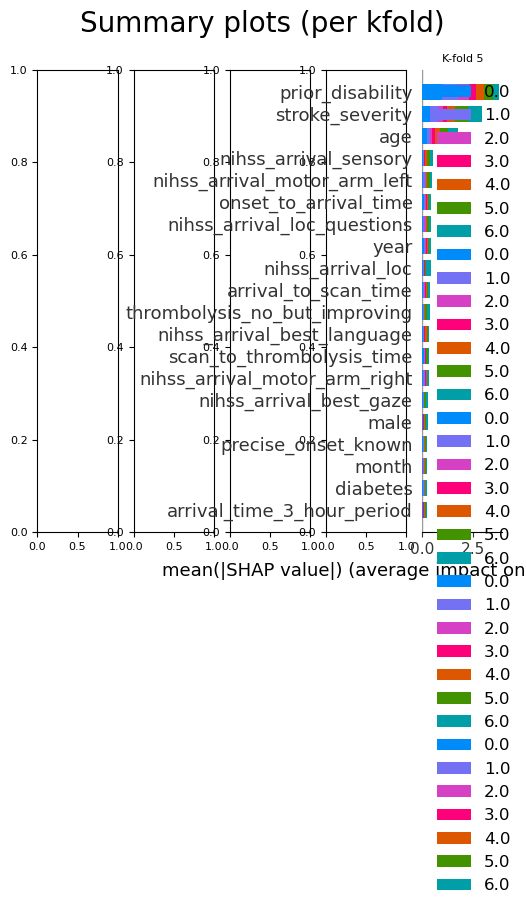

In [ ]:
# Define for the figure
nrows = 1
ncols = 5
fig, axs = plt.subplots(nrows=nrows, ncols=ncols,figsize=(15, 10))

fig.suptitle('Summary plots (per kfold)', fontsize=20)
fig.set_size_inches(20,5)
shrink = 0.5

row = 0
col = 0

# Loop through the kfolds, subplot per kfold
for k in range(5):

    # Get axes
    ax = axs[col] # not take row argument as that only has 1 value, so axs is 1D

#    # Set axis title
#    ax.set_title(f'Kfold {k+1}')

    # Initialise empty list
    shap_values_list = []
    # Putting the SHAP values in the required format
    for c in range(n_classes):
        shap_values_list.append(shap_values_kfold[k][:,:,c])

    # Get k fold split
    (X_train, X_test, y_train, y_test) = get_x_y_data(train_data_kfold[k],
                                                      test_data_kfold[k],
                                                      'discharge_disability')

    # Plot a SHAP summary plot, one for each k-fold
    ax = shap.summary_plot(shap_values_list, X_test.values, plot_type="bar", 
                      class_names=model.classes_, 
                      feature_names=X_test.columns, class_inds="original",
                      show=False, plot_size=(6,6))
    col += 1
plt.title(f"K-fold {k+1}")
plt.tight_layout()
plt.show()

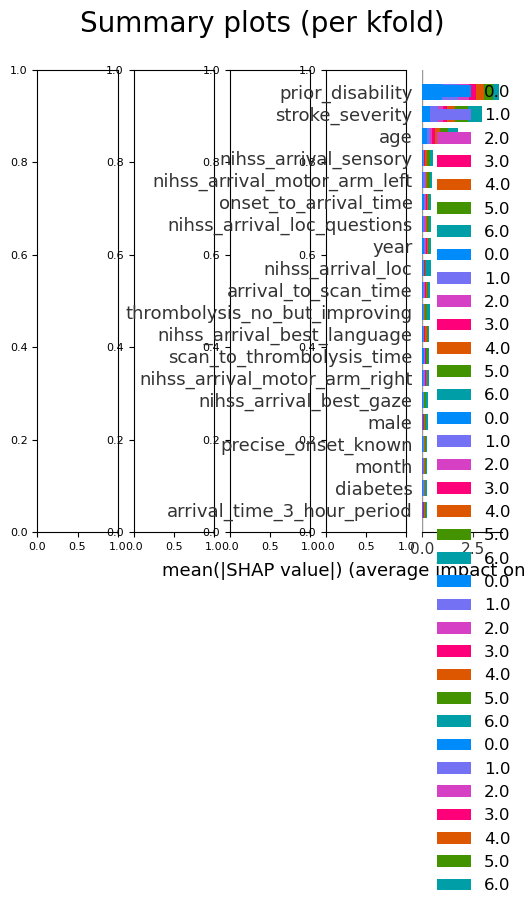

In [ ]:
# Define for the figure
nrows = 1
ncols = 5
fig, axs = plt.subplots(nrows=nrows, ncols=ncols,figsize=(15, 10))

fig.suptitle('Summary plots (per kfold)', fontsize=20)
fig.set_size_inches(20,5)
shrink = 0.5

row = 0
col = 0

k=0

# Initialise empty list
shap_values_list = []
# Putting the SHAP values in the required format
for c in range(n_classes):
    shap_values_list.append(shap_values_kfold[k][:,:,c])

# Get k fold split
(X_train, X_test, y_train, y_test) = get_x_y_data(train_data_kfold[k],
                                                  test_data_kfold[k],
                                                  'discharge_disability')

# Plot a SHAP summary plot, one for each k-fold
axs[0] = shap.summary_plot(shap_values_list, X_test.values, plot_type="bar", 
                    class_names=model.classes_, 
                    feature_names=X_test.columns, class_inds="original",
                    show=False, plot_size=(6,6))



k=1

# Initialise empty list
shap_values_list = []
# Putting the SHAP values in the required format
for c in range(n_classes):
    shap_values_list.append(shap_values_kfold[k][:,:,c])

# Get k fold split
(X_train, X_test, y_train, y_test) = get_x_y_data(train_data_kfold[k],
                                                  test_data_kfold[k],
                                                  'discharge_disability')

# Plot a SHAP summary plot, one for each k-fold
axs[1] = shap.summary_plot(shap_values_list, X_test.values, plot_type="bar", 
                    class_names=model.classes_, 
                    feature_names=X_test.columns, class_inds="original",
                    show=False, plot_size=(6,6))


k=2

# Initialise empty list
shap_values_list = []
# Putting the SHAP values in the required format
for c in range(n_classes):
    shap_values_list.append(shap_values_kfold[k][:,:,c])

# Get k fold split
(X_train, X_test, y_train, y_test) = get_x_y_data(train_data_kfold[k],
                                                  test_data_kfold[k],
                                                  'discharge_disability')

# Plot a SHAP summary plot, one for each k-fold
axs[2] = shap.summary_plot(shap_values_list, X_test.values, plot_type="bar", 
                    class_names=model.classes_, 
                    feature_names=X_test.columns, class_inds="original",
                    show=False, plot_size=(6,6))


k=3

# Initialise empty list
shap_values_list = []
# Putting the SHAP values in the required format
for c in range(n_classes):
    shap_values_list.append(shap_values_kfold[k][:,:,c])

# Get k fold split
(X_train, X_test, y_train, y_test) = get_x_y_data(train_data_kfold[k],
                                                  test_data_kfold[k],
                                                  'discharge_disability')

# Plot a SHAP summary plot, one for each k-fold
axs[3] = shap.summary_plot(shap_values_list, X_test.values, plot_type="bar", 
                    class_names=model.classes_, 
                    feature_names=X_test.columns, class_inds="original",
                    show=False, plot_size=(6,6))


k=4

# Initialise empty list
shap_values_list = []
# Putting the SHAP values in the required format
for c in range(n_classes):
    shap_values_list.append(shap_values_kfold[k][:,:,c])

# Get k fold split
(X_train, X_test, y_train, y_test) = get_x_y_data(train_data_kfold[k],
                                                  test_data_kfold[k],
                                                  'discharge_disability')

# Plot a SHAP summary plot, one for each k-fold
axs[4] = shap.summary_plot(shap_values_list, X_test.values, plot_type="bar", 
                    class_names=model.classes_, 
                    feature_names=X_test.columns, class_inds="original",
                    show=False, plot_size=(6,6))

plt.show()

# KP QUS LOOK AT HOW USE THIS In notevook  230623_xgb_all_data_multiclass_shap.ipynb)

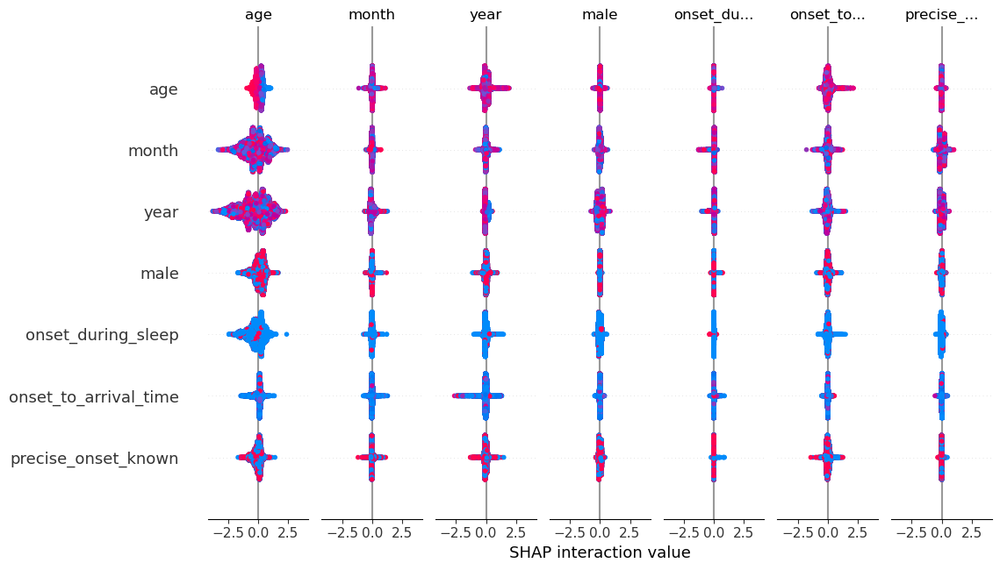

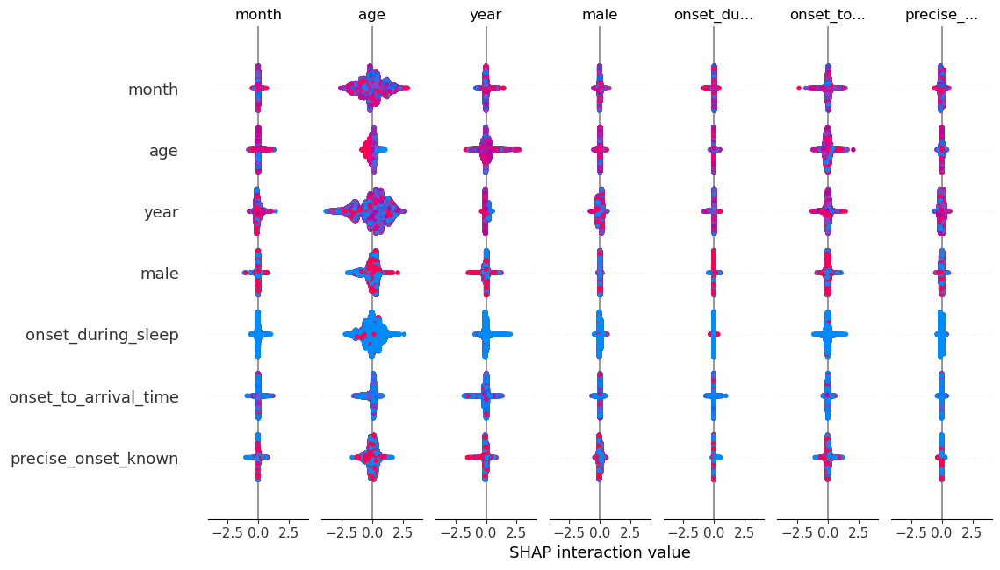

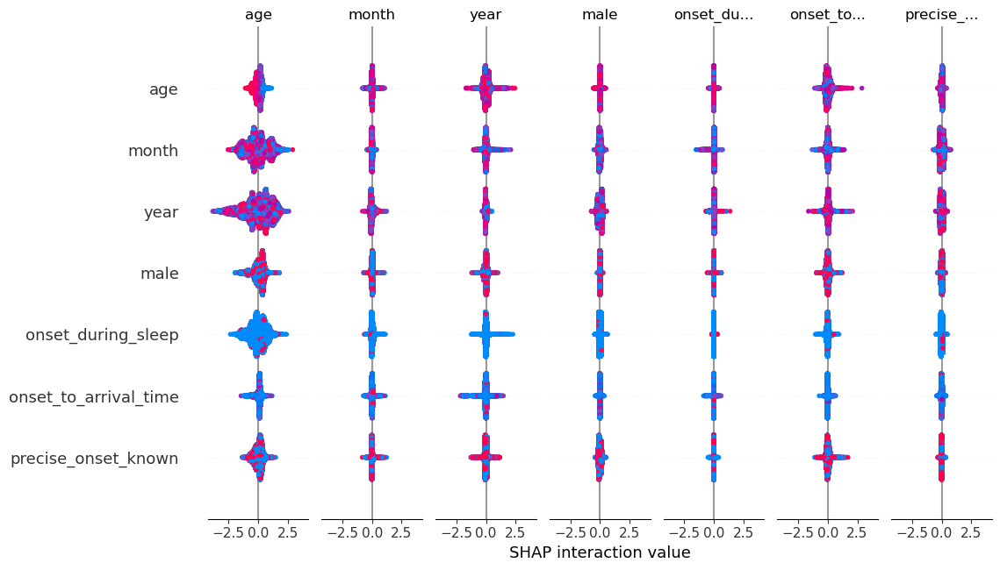

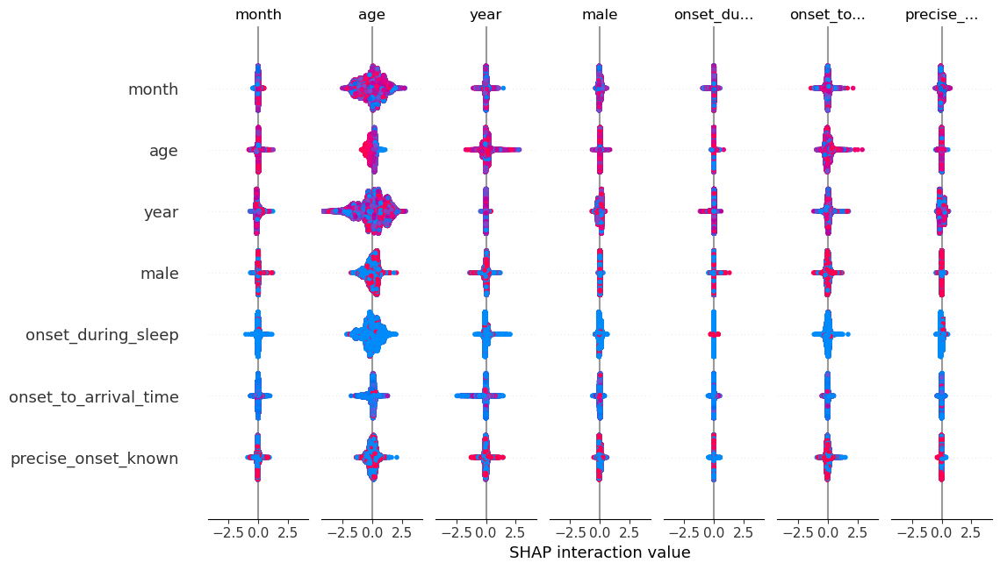

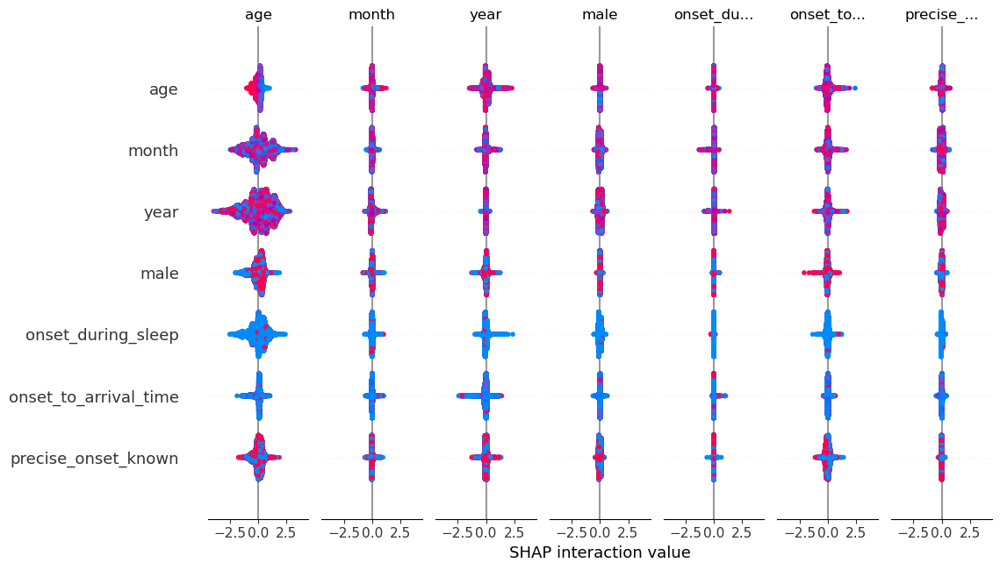

In [ ]:
for k in range(n_kfold):
    # Initialise empty list
    shap_values_list = []
    # Putting the SHAP values in the required format
    for c in range(n_classes):
        shap_values_list.append(shap_values_kfold[k][:,:,c])

    # Get k fold split
    (X_train, X_test, y_train, y_test) = get_x_y_data(train_data_kfold[k],
                                                      test_data_kfold[k],
                                                      'discharge_disability')

    # Plot a SHAP summary plot, one for each k-fold
    shap.summary_plot(shap_values_kfold[k], X_test.values, plot_type="bar", 
                  class_names= class_names, feature_names = X_test.columns, 
                  show=False, plot_size=(6,6))
    
    #plt.title(f"K-fold {k+1}")
    plt.tight_layout()
    plt.show()  
    


In [ ]:
for k in range(n_kfold):
    shap.plots.bar(shap_values_extended_kfold[k])

IndexError: list index out of range

In [ ]:
for k in range(n_kfold):
    shap_values_extended_kfold[k].data.shape

(15363, 168)

shap_values_kfold[k][i, f, c]

You can also see the summary_plot of a specific class.

Loop through the classes, looking at just the one kfold.

shap_values_kfold[kfold][instance, feature, class]

In [ ]:
# Set the default text font size
plt.rc('font', size=8)
# Set the axes title font size
plt.rc('axes', titlesize=8)
# Set the axes labels font size
plt.rc('axes', labelsize=8)
# Set the font size for x tick labels
plt.rc('xtick', labelsize=8)
# Set the font size for y tick labels
plt.rc('ytick', labelsize=8)
# Set the legend font size
plt.rc('legend', fontsize=8)
# Set the font size of the figure title
plt.rc('figure', titlesize=20)
plt.rcParams['font.size'] = 20

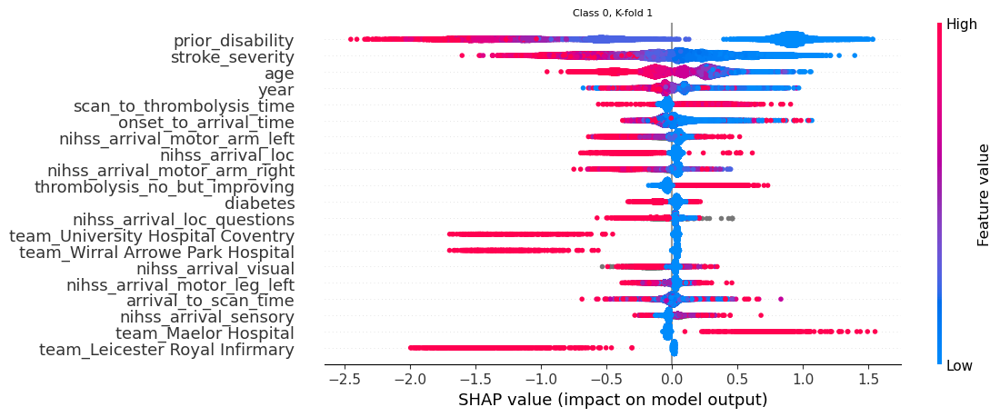

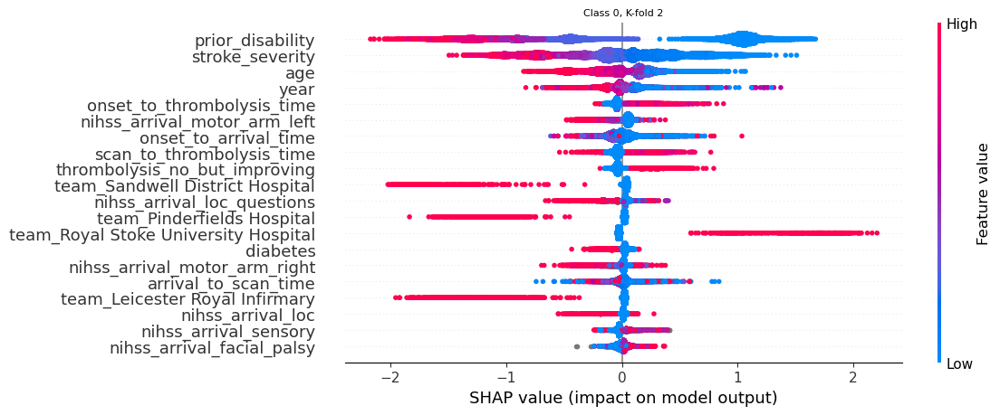

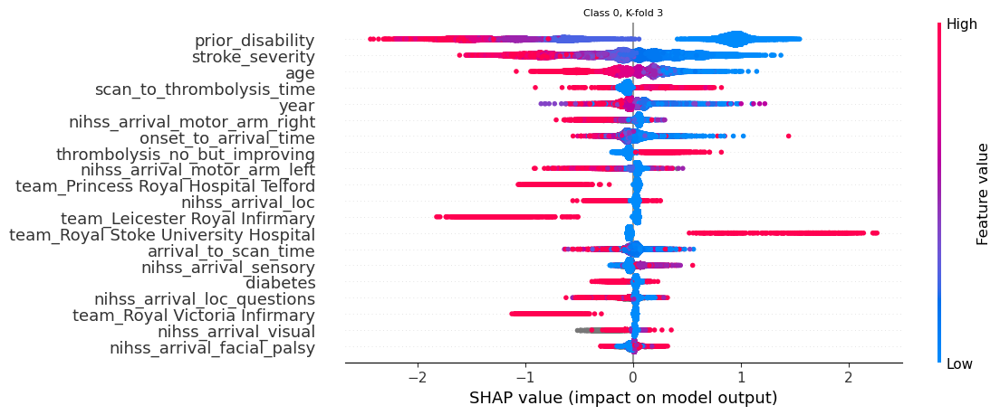

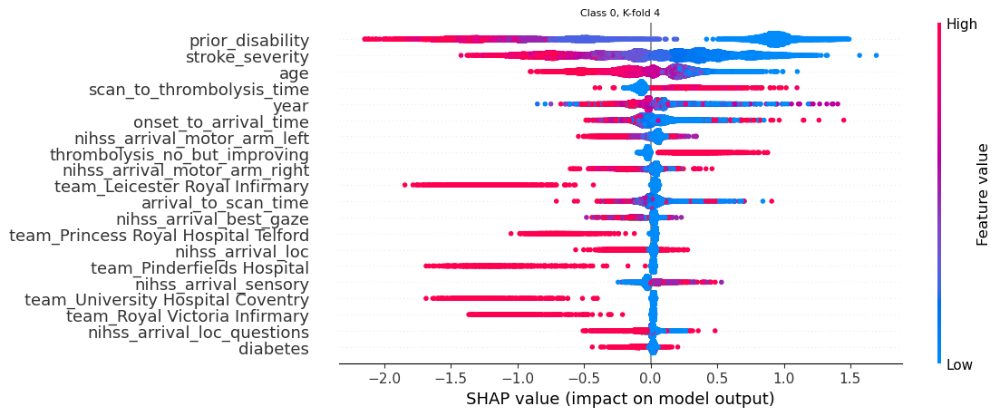

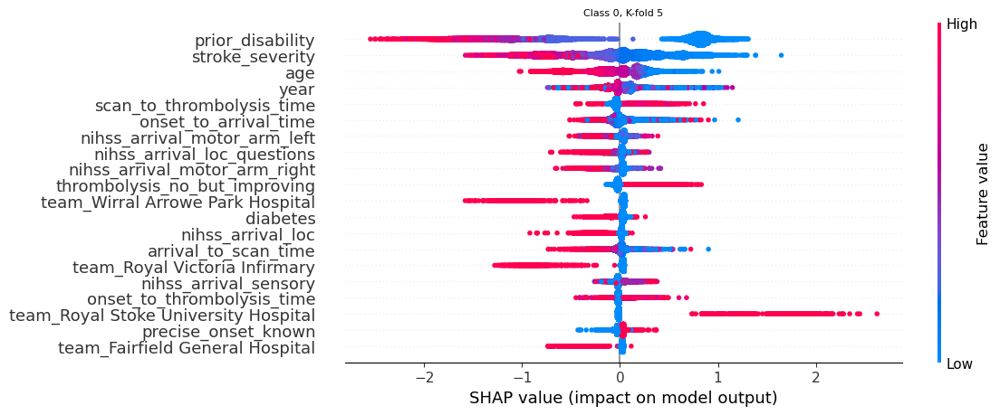

...

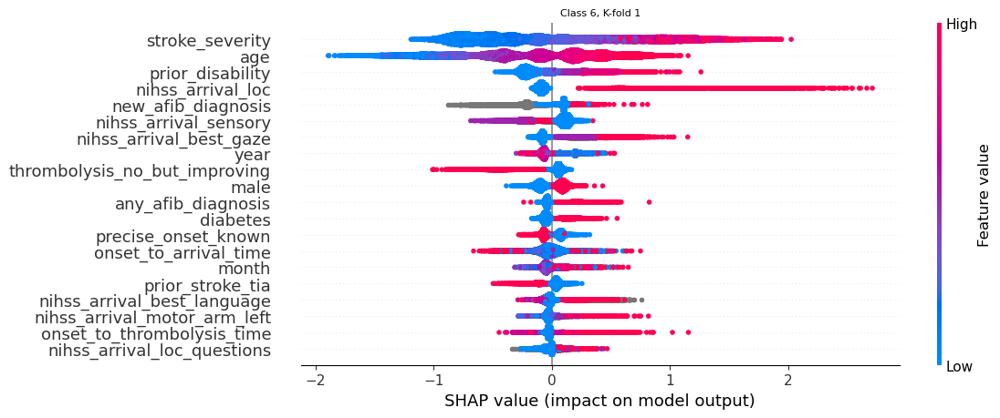

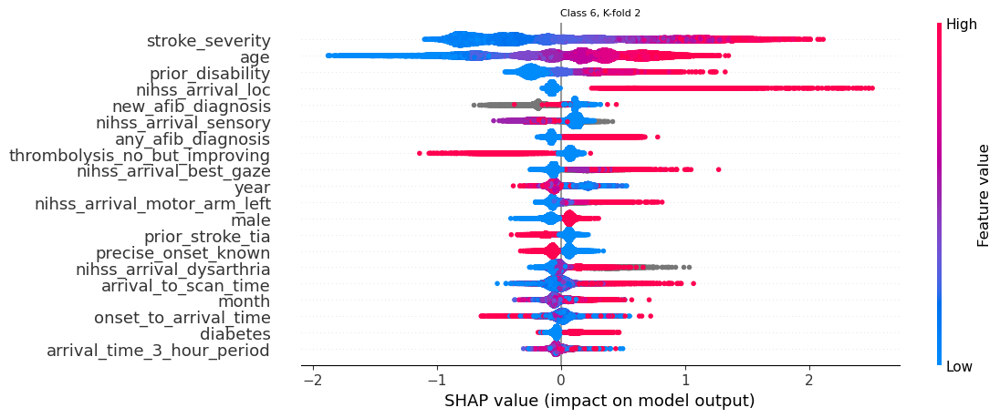

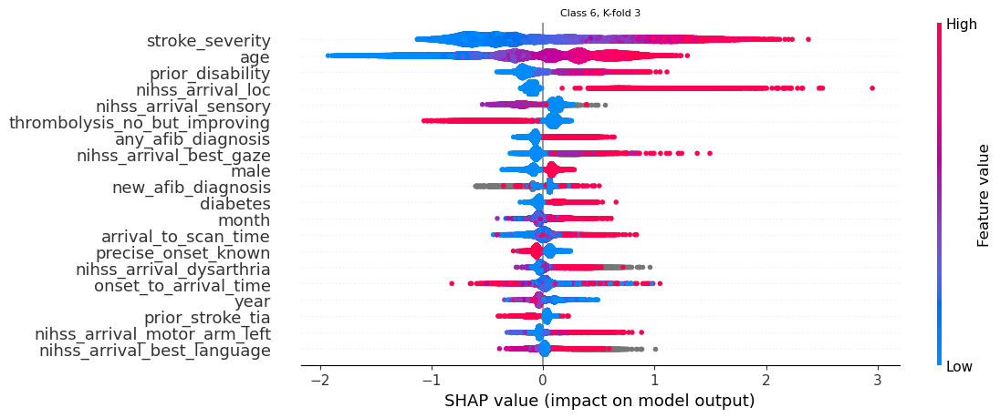

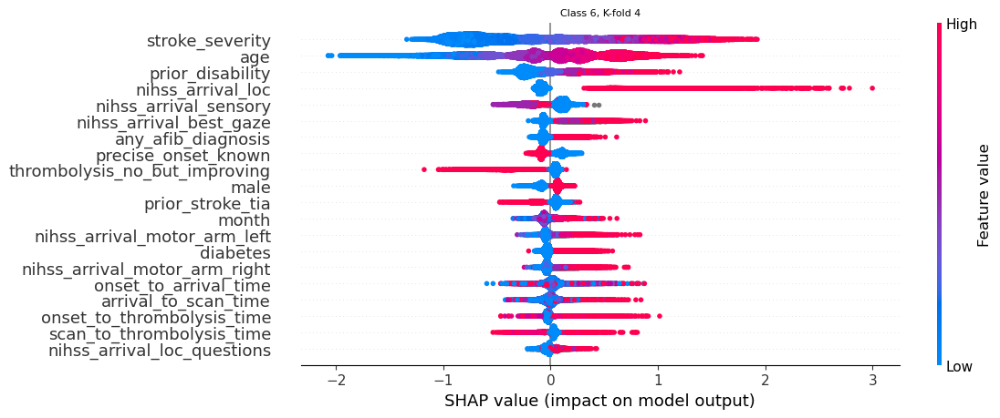

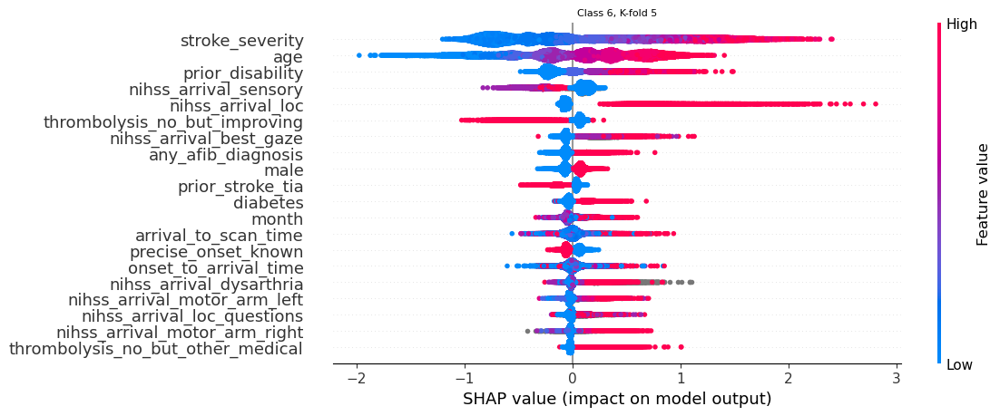

In [ ]:
for c in range(len(class_names)):
    for k in range(5):
        # Get k fold split
        (X_train, X_test, y_train, y_test) = get_x_y_data(train_data_kfold[k],
                                                        test_data_kfold[k],
                                                        'discharge_disability')

        shap.summary_plot(shap_values_kfold[k][:,:,c], X_test.values, 
                        feature_names=X_test.columns, show=False, 
                        plot_size=(12,5))

        plt.title(f"Class {c}, K-fold {k+1}")
        plt.tight_layout()
        plt.show()

Tricky to show as an average over the kfolds (representing the 5 plots in one as average) as the plot is using the SHAP and feature value. Can an average of both be taken?

# OTHER VISUALISATIONS NOT YET TIDIED UP
1. dependence
2. waterfall
3. force

Choose an instance, and kfold as an example for these

In [ ]:
for k in range(n_kfold):
    # Initialise empty list
    shap_values_list = []
    # Putting the SHAP values in the required format
    for c in range(n_classes):
        shap_values_list.append(shap_values_kfold[k][:,:,c])

In [ ]:
instance = 8
k = 0
ranked_feature = 0
c = 0

In [ ]:
(X_train, X_test, y_train, y_test) = get_x_y_data(train_data_kfold[k],
                                                test_data_kfold[k],
                                                'discharge_disability')

What's difference between this way of getting shap_values and the one that follows?

shap_values_extended = shap_values_extended_kfold[k]

####### Shap values exist for each classification in a Tree (the seven mRS levels)

shap_values = shap_values_extended.values

In [ ]:
shap_values_extended = shap_values_extended_kfold[k]
#shap_values_extended.base_values)

33670

In [ ]:
explainer.expected_value[c]


In [ ]:
shap_values = shap_values_kfold[k][:,:,c]

SHAP Dependence Plot

# KP QUS LOOK AT HOW USE THIS In notevook  230623_xgb_all_data_multiclass_shap.ipynb)
INCLUDE HISTOGRAMS FROM THERE TOO

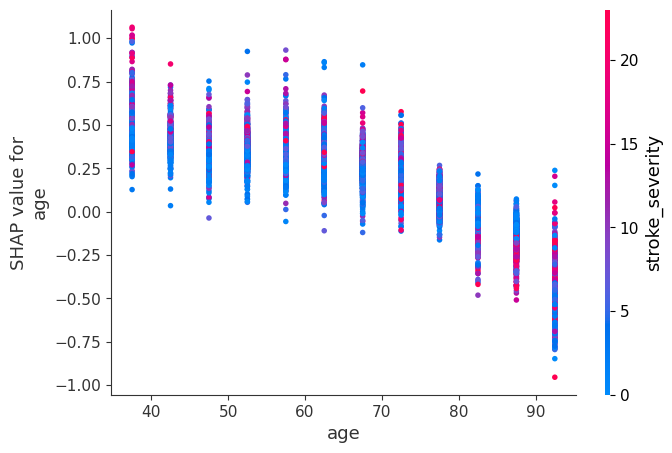

In [ ]:
shap.dependence_plot(ranked_feature, shap_values, X_test.values, 
                     feature_names=X_test.columns)

In [ ]:
shap_values_list[c]

array([[-3.36532111e-01, -6.28838060e-03, -1.21902629e-02, ...,
         2.32146798e-03, -2.65159067e-03,  2.73301117e-04],
       [ 2.00683612e-01, -3.75703866e-03,  9.55528268e-02, ...,
        -1.14361764e-03,  2.07120631e-03,  1.55557580e-04],
       [ 1.88097340e-01, -5.21498965e-03, -7.33787373e-02, ...,
         5.85510166e-03, -6.29412849e-05,  1.01314384e-03],
       ...,
       [ 1.37284965e-01,  1.84716152e-02,  4.09068391e-02, ...,
         1.34679217e-03, -1.45685446e-03, -1.85178470e-03],
       [ 1.81436704e-01,  1.56379965e-02, -9.82512927e-02, ...,
         3.02511266e-03,  4.84093755e-03,  4.46735490e-03],
       [ 3.55980358e-01, -5.55542275e-03,  3.47925781e-01, ...,
         3.10055549e-03, -1.55837368e-03, -5.57587352e-04]])

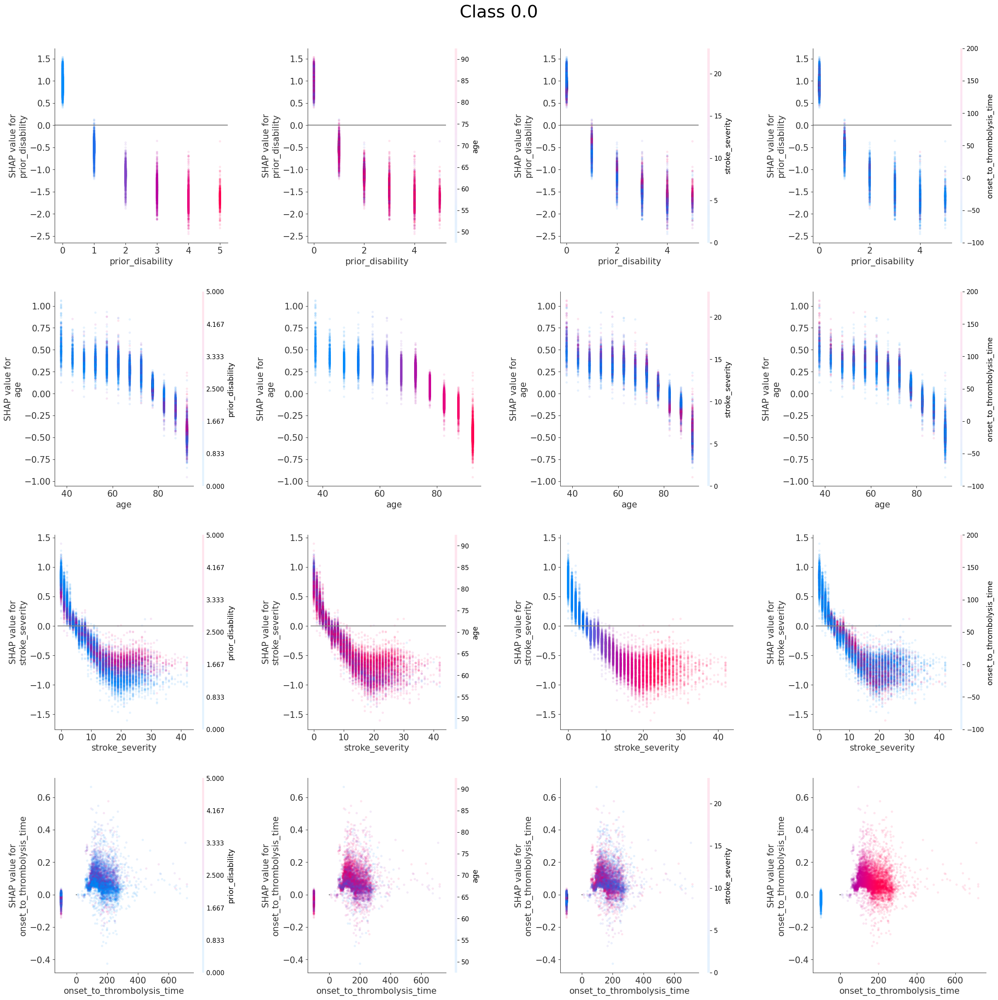

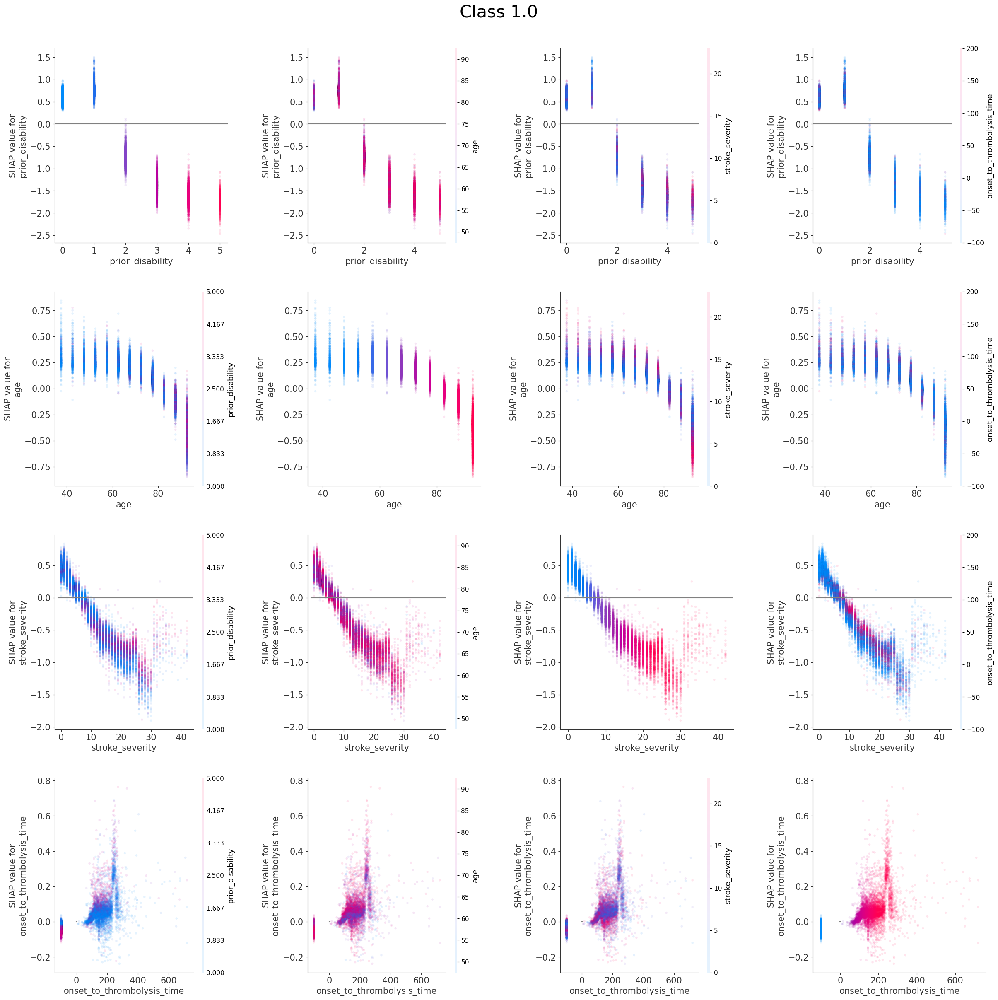

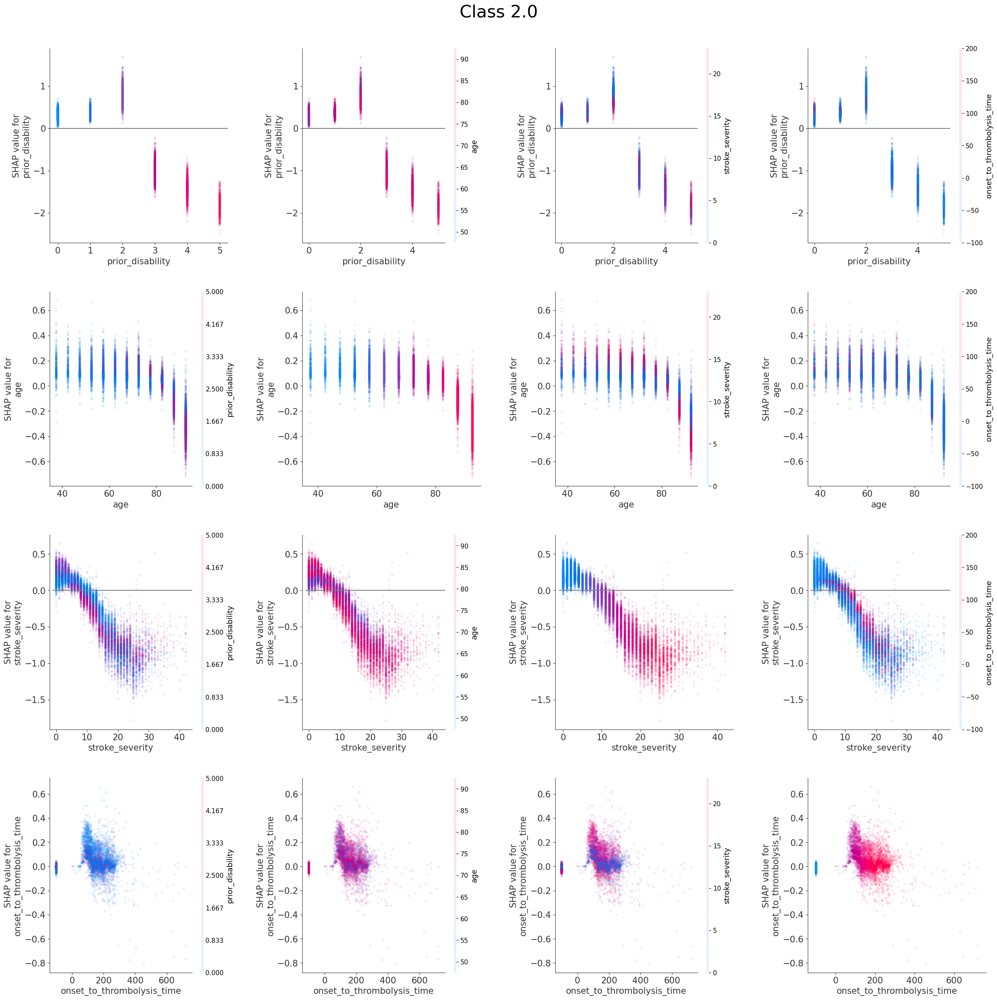

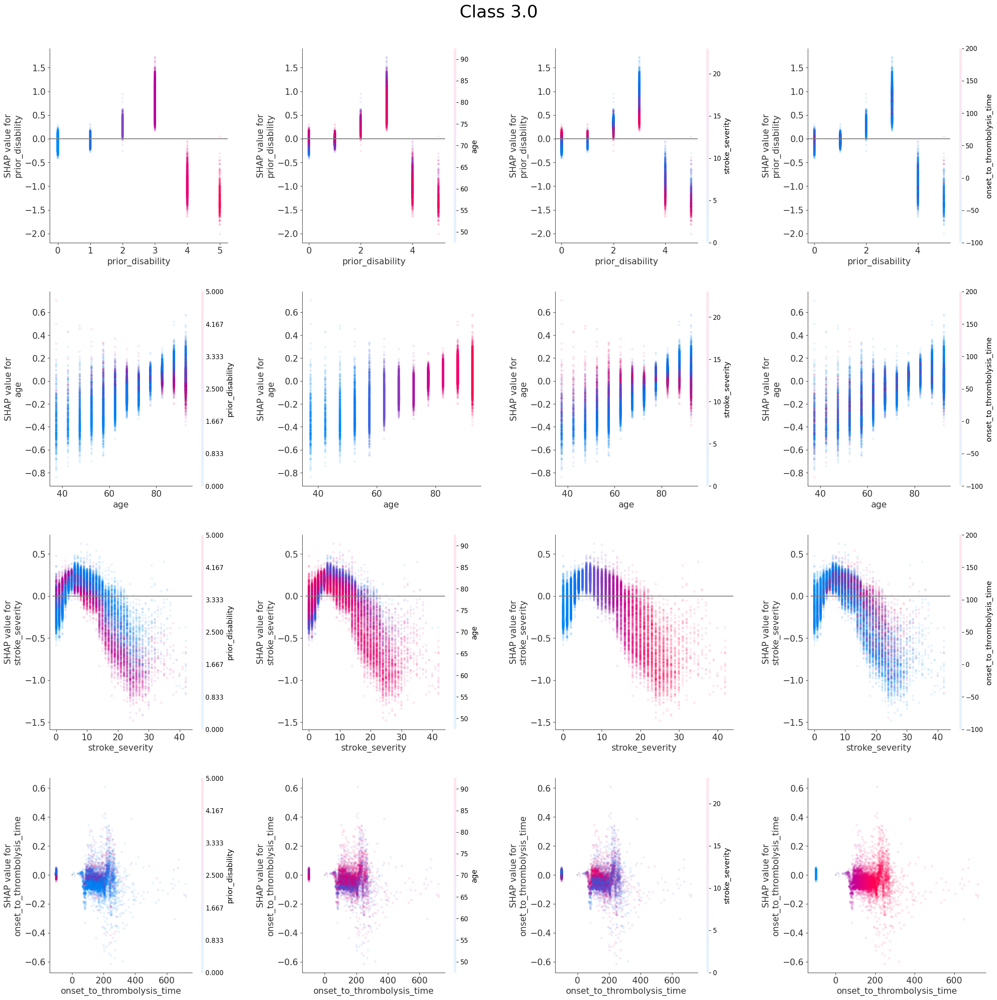

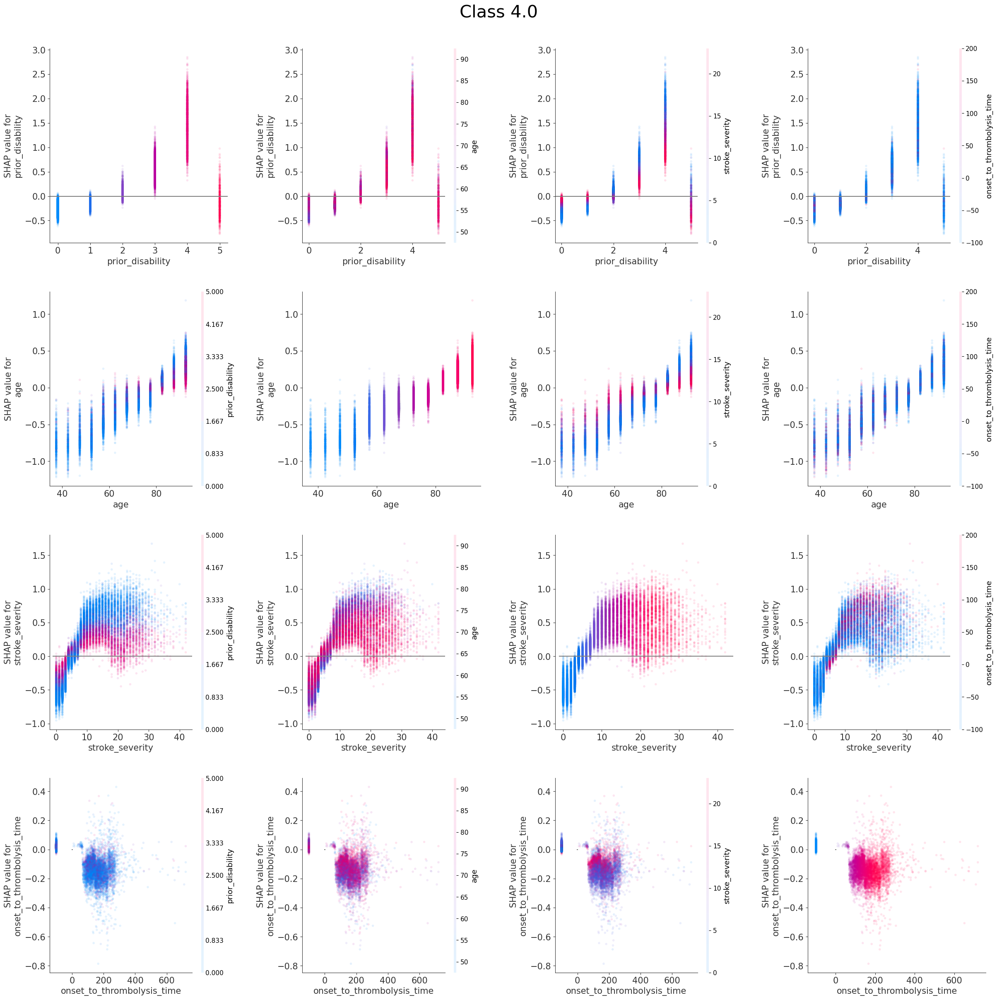

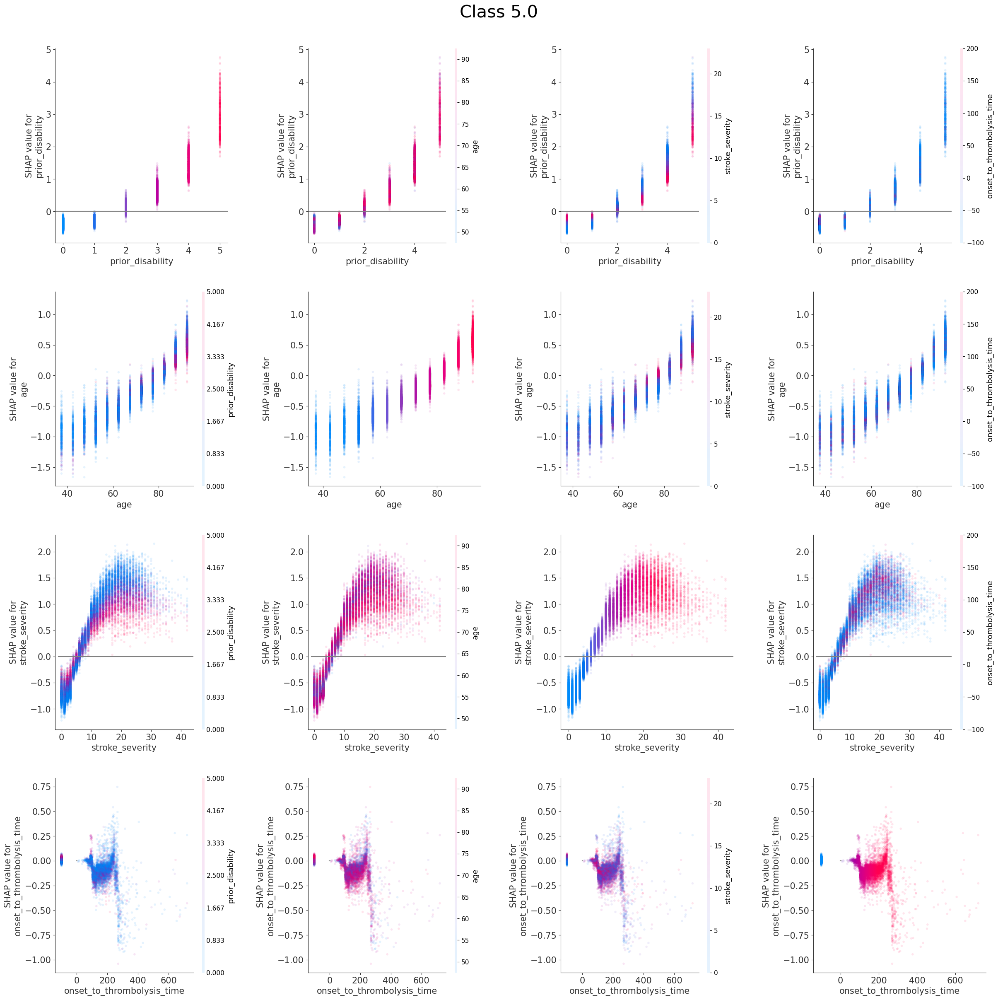

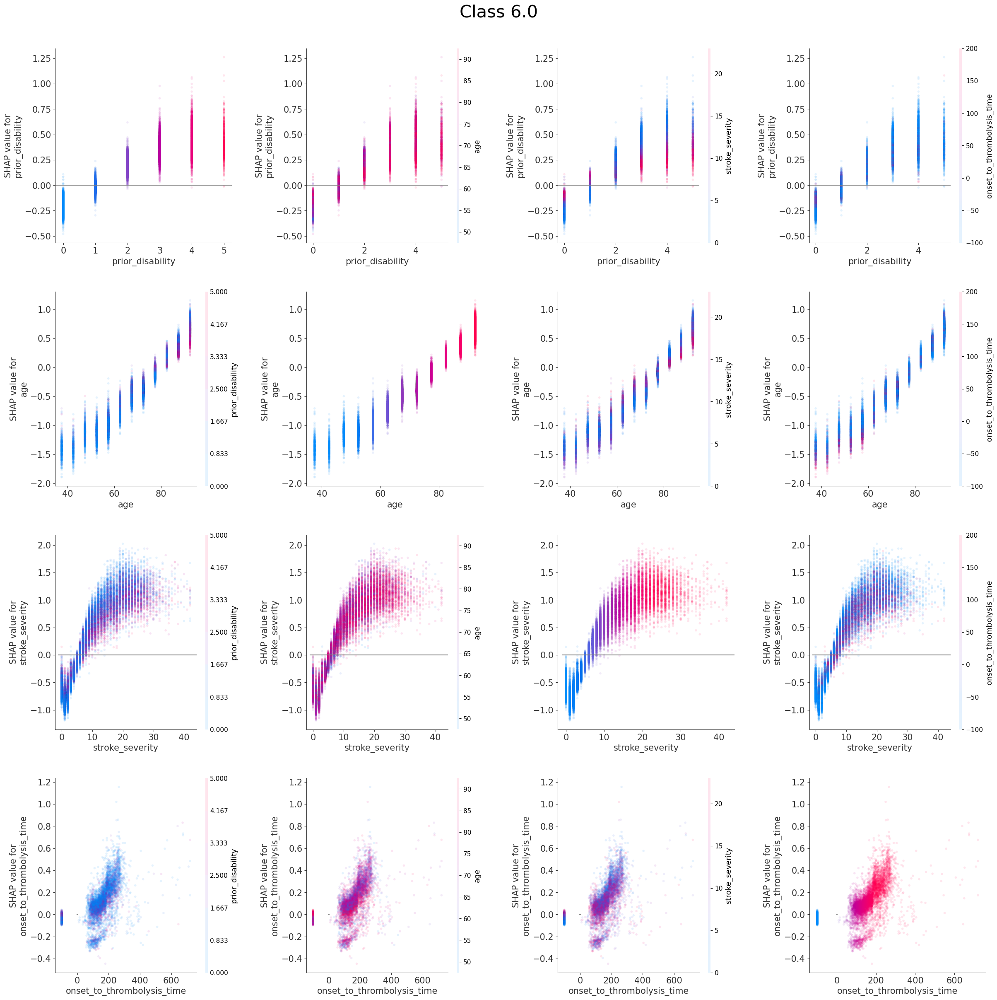

In [ ]:
features_to_show = ["prior_disability", "age", "stroke_severity", 
                    "onset_to_thrombolysis_time"]

k = 0

# Create a matrix of subplots per class. Each showing the relationship between
# each combination of features on the SHAP value.
for c in range(n_classes):

    # setup matrix of subplots
    fig, axes = plt.subplots(nrows=n_features_show,
                             ncols=n_features_show)
    axes = axes.ravel()

    # Set overall title
    fig.suptitle(f'Class {model.classes_[c]}', fontsize=30)

    # Initialise subplot counter
    count = 0

    # Loop through the features to display
    for i in range(len(features_to_show)):
        # Loop through the features to display
        for j in range(len(features_to_show)):
            # Create the plot. Pass the axes
            shap.dependence_plot(ind=features_to_show[i], 
                                interaction_index=features_to_show[j], 
                                shap_values=shap_values_kfold[k][:,:,c], 
                                features=X_test.values, 
                                feature_names=X_test.columns,
                                show=False, ax=axes[count],
                                alpha=0.1)#, dot_size=2)
            # reduce the dot size/transparancy to reveal dense vs sparse areas
            #https://slundberg.github.io/shap/notebooks/plots/dependence_plot.html
            
            # Add line as shap=0
            axes[count].plot([-1, X_test[features_ohe[i]].max()+1],
                             [0,0],c='0.5')
            
            # Increase subplot counter
            count+=1
    
    # Change font size for each subplot
    for ax in axes:
        ax.set_xlabel(ax.get_xlabel(), fontsize=15)
        ax.set_ylabel(ax.get_ylabel(), fontsize=15)
        ax.tick_params(axis='both',which='major',labelsize=15)

    # Visual propoerties of figure
    dimension = 5 * 5
    fig.set_figheight(dimension)
    fig.set_figwidth(dimension)
    fig.tight_layout(pad=2)
    plt.show()

SHAP Force plot

# KP QUS WHAT'S explainer.expected_value[c]?

In [ ]:
shap.force_plot(explainer.expected_value[c], shap_values_kfold[k][instance,:,c], 
                X_test.values[instance], feature_names = X_test.columns)

SHAP waterfall plot

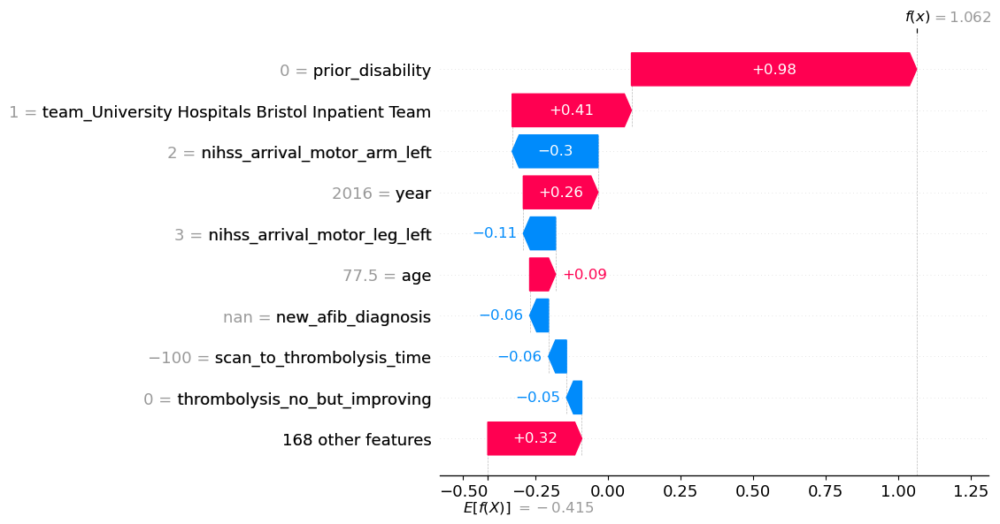

In [ ]:
shap.waterfall_plot(shap.Explanation(values=shap_values_kfold[k][instance,:,c], 
                                     base_values=explainer.expected_value[c], 
                                     data=X_test.iloc[instance],  
                                     feature_names=X_test.columns.tolist()))

Let's view the waterfall plots for all of the outcome classes for a single instance.

Create a function to create a set of subplots

In [ ]:
def create_waterfall_multiclass_grid(row, y_data_row, n_classes, shap_values_list_row,
                                     base_values, data, feature_names):

    # Create a matrix of subplots per class. Each showing the relationship between
    # each combination of features on the SHAP value.
    # setup matrix of subplots
    fig = plt.figure()

    # Set overall title
    # FILL IN THE PREDICTED CLASS VALUE
    fig.suptitle(f'Waterfall for instance {row} '
                f'(observed discharge mRS = {y_data_row}), '
                f'(predicted discharge mRS = {})', 
                fontsize=30)

    # Initialise subplot counter
    count = 1

    for c in range(n_classes):
        ax = fig.add_subplot(4,2,count)
        shap.waterfall_plot(shap.Explanation(values=shap_values_list_row[c], 
                                            base_values=base_values[c], 
                                            data=data,  
                                            feature_names=feature_names), 
                                            show=False)
        ax. set_title(f"Predicted discharge mRS {c}")
        # Increase subplot counter
        count+=1
        
    plt.gcf().set_size_inches(20,15)
    plt.tight_layout()
    # Change font size for each subplot
    #for ax in axes:
    #    ax.set_xlabel(ax.get_xlabel(), fontsize=15)
    #    ax.set_ylabel(ax.get_ylabel(), fontsize=15)
    #    ax.tick_params(axis='both',which='major',labelsize=15)

    # Visual propoerties of figure
    #dimension = 5 * 5
    #fig.set_figheight(dimension)
    #fig.set_figwidth(dimension)
    #fig.tight_layout(pad=2)
    plt.show()

    return()

View waterfall plots for all classes for a single instance.

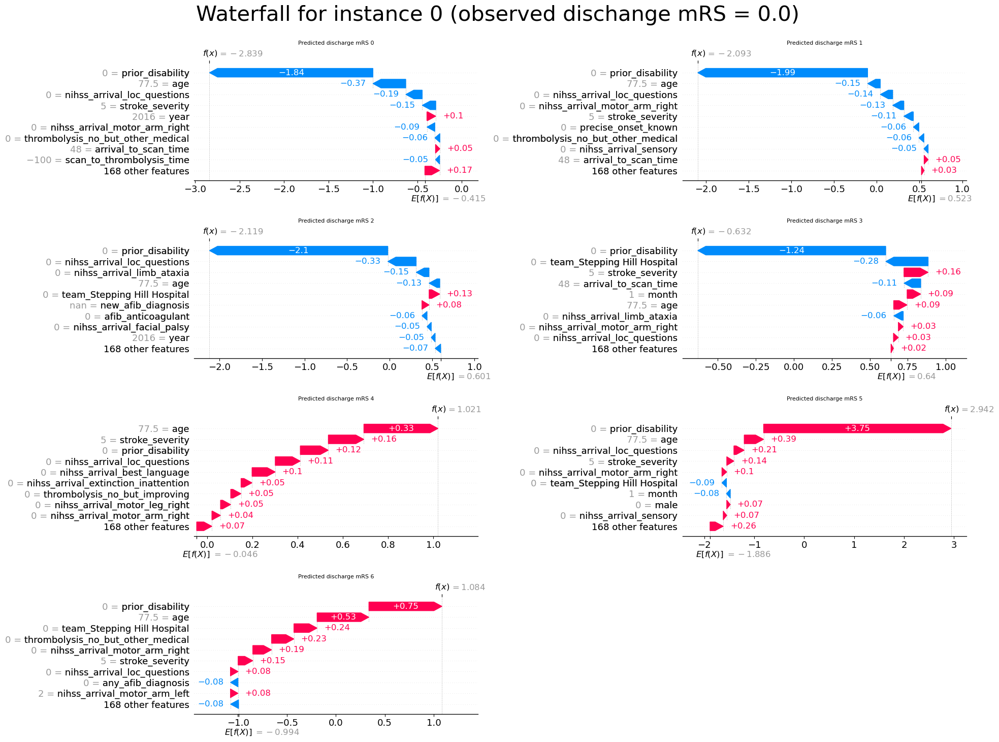

()

In [ ]:
# Through each array in the list and extract just the row want to plot (put that back in the list)
shap_values_list_instance = []
for a in shap_values_list:
    shap_values_list_instance.append(a[instance,:])

# Call funciton to create subplots
create_waterfall_multiclass_grid(row, y_test.iloc[instance], n_classes, 
                                 shap_values_list_instance,
                                 explainer.expected_value, X_test.iloc[instance], 
                                 X_test.columns.tolist())

Violin plots show the relationship between feature value and SHAP value for all of the features Output descriptive text to use in the paper to describe the differences a feature value had on the likelihood of receiving thromboylsis.

Resource: https://towardsdatascience.com/binning-records-on-a-continuous-variable-with-pandas-cut-and-qcut-5d7c8e11d7b0 https://matplotlib.org/3.1.0/gallery/statistics/customized_violin.html

In [ ]:
def set_ax(ax, category_list, feat, rotation=0):
    '''
    ax [matplotlib axis object] = matplotlib axis object
    category_list [list] = used for the xtick labels (the grouping of the data)
    feat [string] = used in the axis label, the feature that is being plotted
    rotation [integer] = xtick label rotation

    reeturn [matplotlib axis object]
    
    resource: 
    https://matplotlib.org/3.1.0/gallery/statistics/customized_violin.html
    '''
    # Set the axes ranges and axes labels
    ax.get_xaxis().set_tick_params(direction='out')
    ax.xaxis.set_ticks_position('bottom')
    ax.set_xticks(np.arange(1, len(category_list) + 1))
    ax.set_xticklabels(category_list, rotation=rotation, fontsize=7)
    ax.set_xlim(0.25, len(category_list) + 0.75)
    ax.set_ylabel(f'SHAP values for {feat}', fontsize=12)
    ax.set_xlabel(f'Feature values for {feat}', fontsize=12)
    return(ax)

In [ ]:
def create_grid_of_violin_plots(features_violin, 
                                class_category,
                                shap_values_extended
                                ):
    # Feature Age needs special consideration. It needs the x ticks to be created,
    # as the other features with over 50 unique values, but age is already grouped 
    # for the model (into 5yr groups) and so is treated as the other type.

    # Create figure
    fig = plt.figure(figsize=(12,14), constrained_layout=True)


    fig.suptitle(f'Model to predict discharge disability mRS = {class_category}', fontsize=20)

    # A subplot showing violin plot for each feature.
    # First prepare the fature data for the violin plot: if feature has more than 
    # 50 unique values then assume it needs to be binned (a violin for each bin)

    # Determine number of rows of subplots by rounding up
    ncols = 2
    nrows = math.ceil(len(features_violin)/ncols)

    # Through each feature
    for n, feat in enumerate(features_violin):    
        
        # Get data and SHAP values
        feature_data = shap_values_extended[:, feat, class_category].data
        feature_shap = shap_values_extended[:, feat, class_category].values

        # If feature has more that 50 unique values, then assume it needs to be 
        # binned (otherwise assume they are unique categories)

        if np.unique(feature_data).shape[0] > 50:
            # bin the data, create a violin per bin
            
            # settings for the plot
            rotation = 45
            step = 30
            n_bins = min(11, np.int((feature_data.max())/step))
            
            # create list of bin values
            bin_list = [(i*step) for i in range(n_bins)]
            bin_list.append(feature_data.max())
            if feat == "onset_to_thrombolysis_time":
                # for -100 for no IVT
                bin_list.insert(0, feature_data.min())

            # Number of instances per bin
            #counts, edges, plot = plt.hist(feature_data, bins=bin_list)
            counts, edges = np.histogram(feature_data, bins=bin_list, density=False)

            # create list of bins (the unique categories)
            category_list = [f'{i*step}-{((i+1)*step-1)}\n[n={int(counts[i+1])}]' for i in range(n_bins-1)]
            category_list.append(f'{(n_bins-1)*step}+\n[n={int(counts[-1])}]')
            if feat == "onset_to_thrombolysis_time":
                # for -100 for no IVT
                category_list.insert(0, f'Not receive IVT\n[n={int(counts[0])}]')

            # bin the feature data
            feature_data = pd.cut(feature_data, bin_list, labels=category_list, 
                                right=False)

            # create a list, each entry contains the corresponsing SHAP value for that 
            # category (or bin). A violin will represent each list.    
            shap_per_category = []
            for category in category_list:
                mask = feature_data == category
                shap_per_category.append(feature_shap[mask])

        else:
            # create a violin per unique value
            
            # settings for the plot
            rotation = 90
            
            # create list of unique categories in the feature data
            category_list = np.unique(feature_data)

            # Age needs to keep its decimal value (midpoint between 5 yrs)
            if feat != 'age':
                category_list = [int(i) for i in category_list]

            # create a list, each entry contains the corresponsing SHAP value for that 
            # category (or bin). A violin will represent each list.    
            count = []
            shap_per_category = []
            for category in category_list:
                mask = feature_data == category
                shap_per_category.append(feature_shap[mask])
                count.append(mask.sum())
#                if feat == 'stroke_severity':
#                    print(feature_shap[mask].max())

            if feat == 'age':
                # create text of x ticks
                category_list = [f'{int(i-2.5)}-{int(i+2.5)}' for i in category_list]

                # SSNAP dataset had oldest age category as 100-120 (not a 5 yr band as 
                #   the other ages). To accommodate this, if last age category is "110"
                #   then overwrite the label with the correct band (100-120), and not
                #   107-112 as the above code would create.
                if category_list[-1] == '107-112':
                    category_list[-1] = '100-120'
            if feat == 'stroke_severity':
                # not enough space of chart for 2 lines fo x tick labels
                category_list = [f'{category_list[i]} [n={count[i]}]' for i in range(len(category_list))]
            else:
                category_list = [f'{category_list[i]}\n[n={count[i]}]' for i in range(len(category_list))]

        # create violin plot
        ax = fig.add_subplot(nrows,ncols,n+1)

        ax.violinplot(shap_per_category, showmeans=True, widths=0.9, 
                      showextrema=False)

        # Add line at Shap = 0
        feature_values = shap_values_extended[:, feat].data
        ax.plot([0, len(feature_values)], [0,0],c='0.5')   

        # customise the axes
        ax = set_ax(ax, category_list, feat, rotation=rotation)
        plt.subplots_adjust(bottom=0.15, wspace=0.05)

        # Adjust stroke severity tickmarks
        if feat == 'Stroke severity':
            ax.set_xticks(np.arange(1, len(category_list)+1, 2))
            ax.set_xticklabels(category_list[0::2])   
            
        # Add title
        ax.set_title(feat)
        
    plt.tight_layout(pad=2)
        
    fig.savefig(f'{paths.notebook}_{paths.model_text}_thrombolysis_shap_violin_all_'
                f'features_for_mRS{class_category}.jpg', 
                dpi=300, bbox_inches='tight', pad_inches=0.2)

    plt.show()
    return()

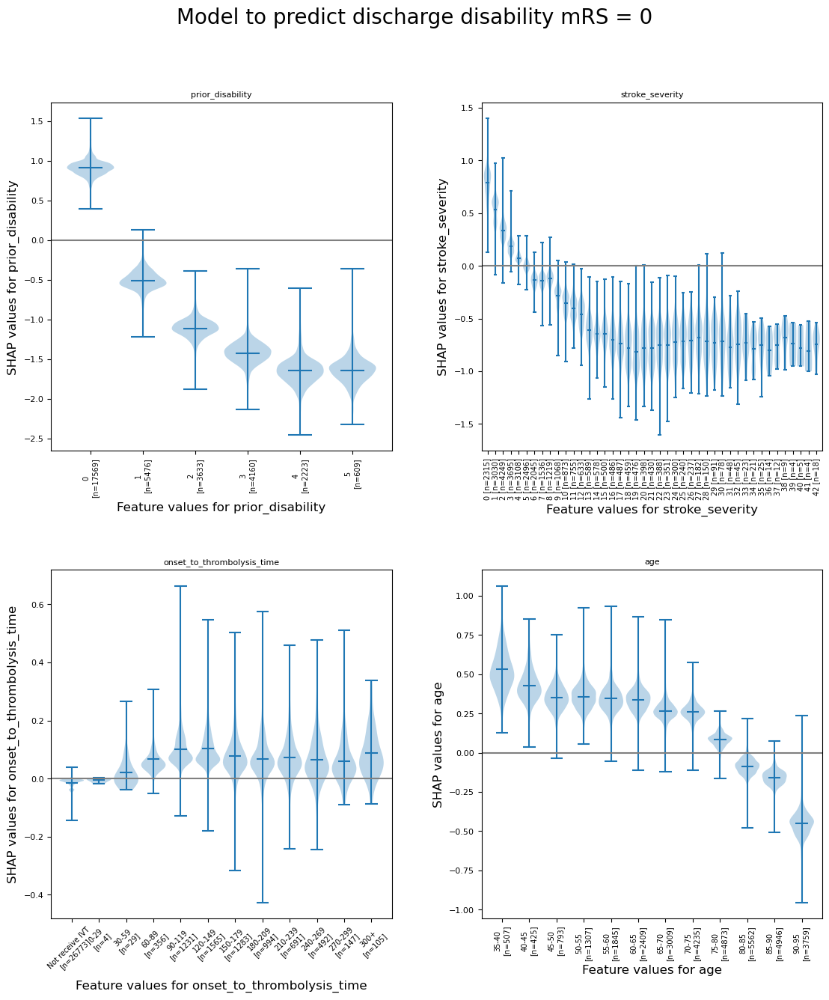

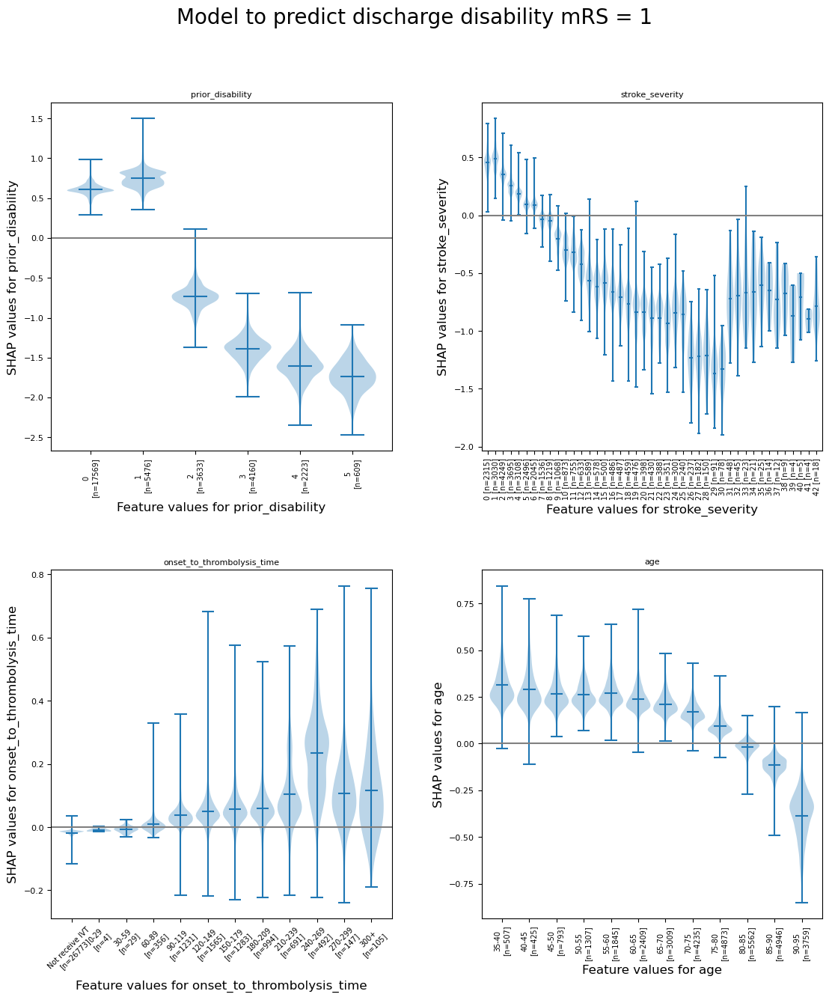

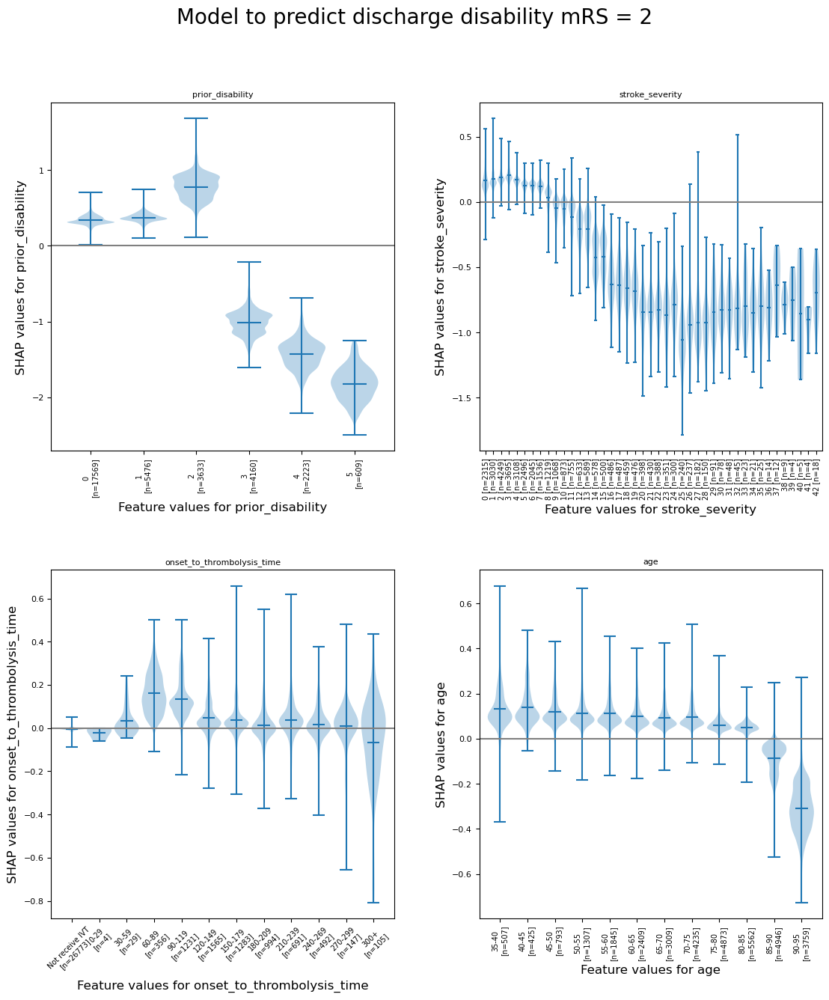

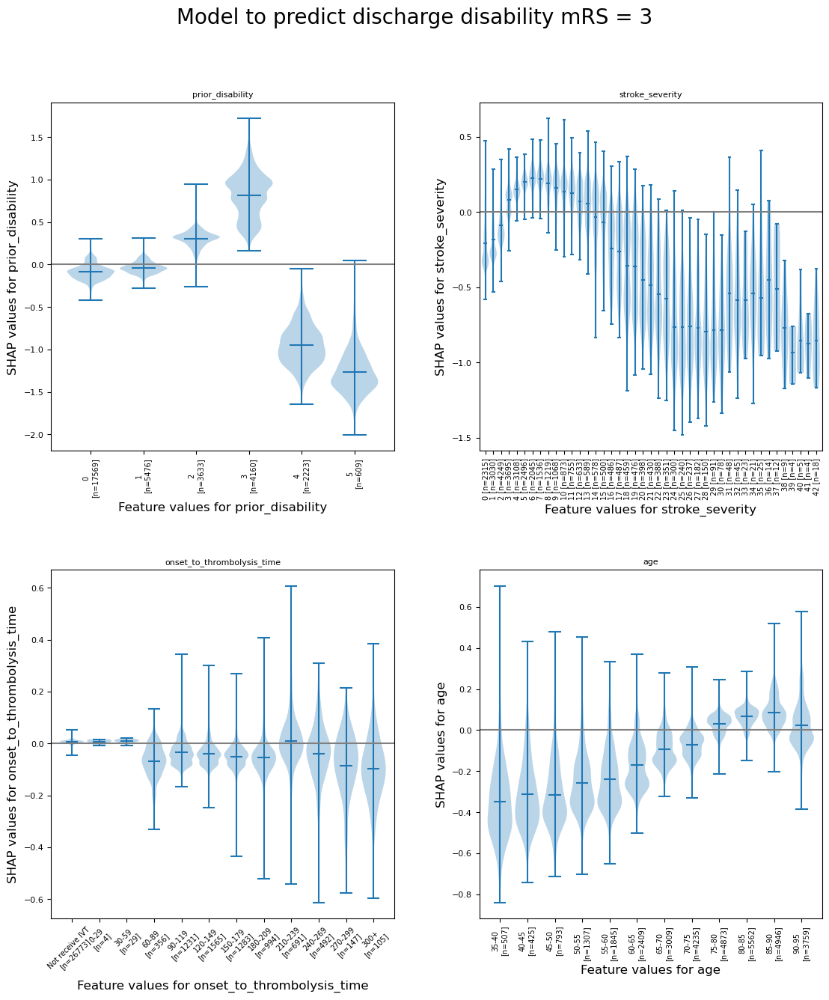

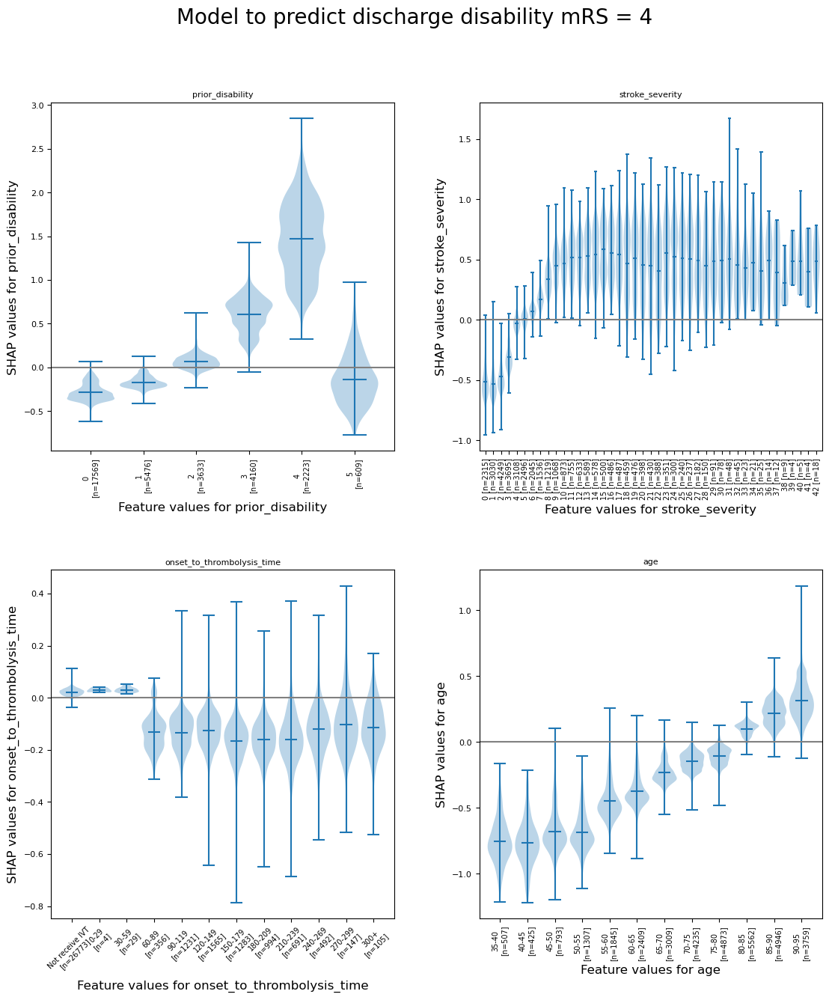

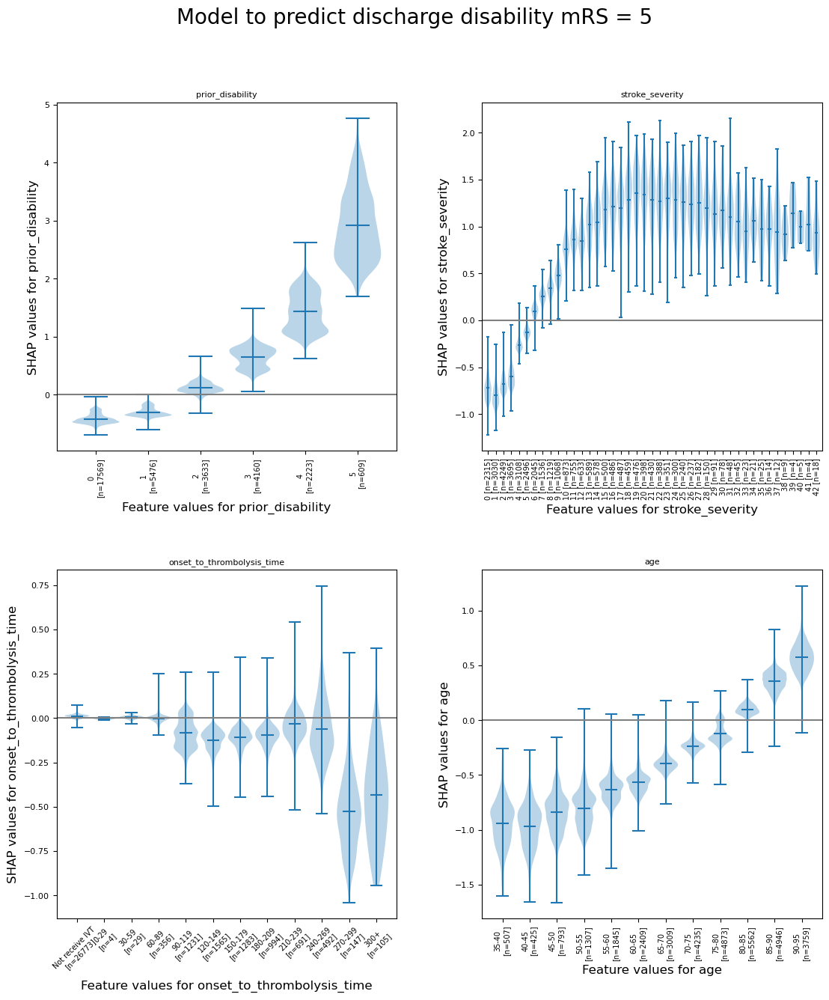

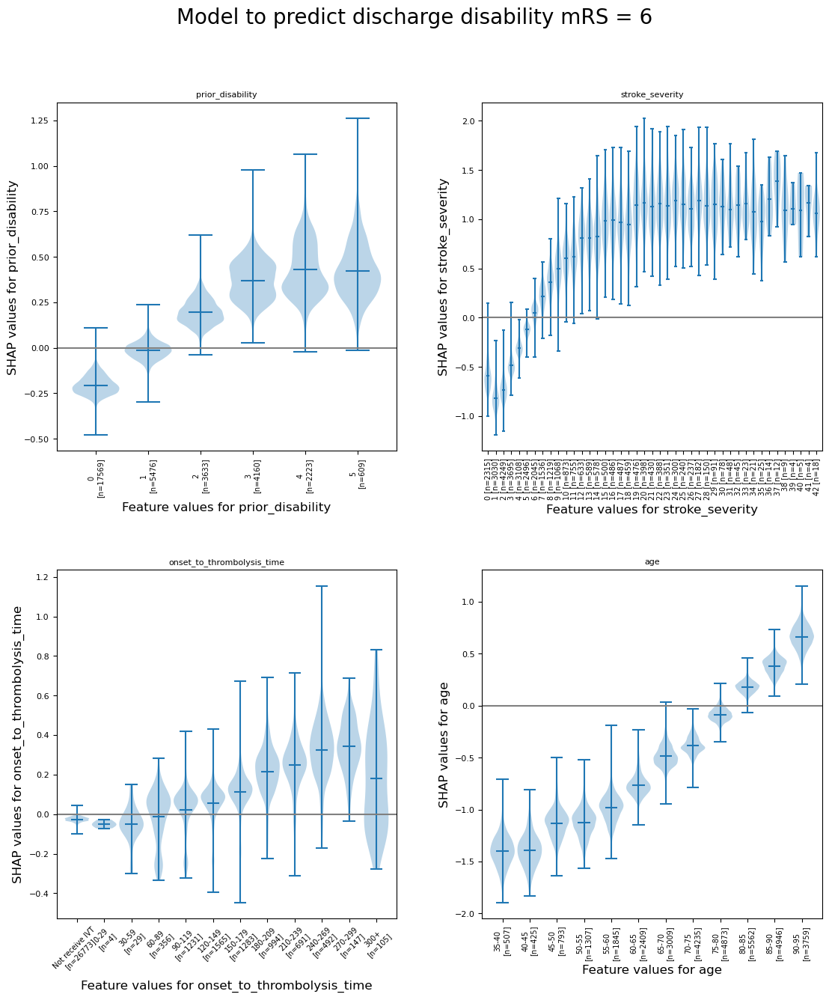

In [ ]:
k = 0
shap_values_extended = shap_values_extended_kfold[k]

# Features to include in the violin plot grid
features_violin = ['prior_disability','stroke_severity',
                   'onset_to_thrombolysis_time','age']

for c in range(n_classes):
    create_grid_of_violin_plots(features_violin, 
                                c,
                                shap_values_extended
                                )

Compare SHAP values for the hospital one-hot encoded features The hospital feature is one-hot encoded, so there is a SHAP value per stroke team. We will use this to create a histogram of the frequency of the SHAP value for the hospital feature (take the mean of the SHAP values for the instances for each hospital's own patients).

In [ ]:
def create_histogram_data_and_plot(test_stroke_team,
                                   shap_values,
                                   features_ohe,
                                   class_category):

    # Set up list for storing patient data and hospital SHAP
    feature_data_with_shap = []

    # Get mean SHAP for stroke team when patient attending that stroke team
    unique_stroketeams_list = list(np.unique(test_stroke_team))
    stroke_team_mean_shap = []
    # Loop through stroke teams
    for stroke_team in unique_stroketeams_list:
        # Identify rows in test data that match each stroke team
        mask = test_stroke_team == stroke_team
        # Extract those rows, for the class
        stroke_team_shap_all_features = shap_values[mask,:,class_category]#shap_values[mask]
        # Get column index for stroke_team_in_shap
        feature_name = 'team_' + stroke_team
        index = features_ohe.index(feature_name)
        # Get SHAP values for hospital
        stroke_team_shap = stroke_team_shap_all_features[:, index]
        # Get mean
        mean_shap = np.mean(stroke_team_shap)
        # Store mean
        stroke_team_mean_shap.append(mean_shap)
        # Get and store feature data and add SHAP
        feature_data = data[mask]
        feature_data['Hospital_SHAP'] = stroke_team_shap
        feature_data_with_shap.append(feature_data)

    # Concatenate and save feature_data_with_shap
    feature_data_with_shap = pd.concat(feature_data_with_shap, axis=0)
    feature_data_with_shap.to_csv(
    f'./{paths.notebook}_{paths.model_text}_feature_data_with_hospital_shap.csv', 
        index=False)

    # Create and save shap mean value per hospital
    hospital_data = pd.DataFrame()
    hospital_data["stroke_team"] = unique_stroketeams_list
    hospital_data["shap_mean"] = stroke_team_mean_shap
    hospital_data.to_csv(
        f'./{paths.notebook}_{paths.model_text}_mean_shap_per_hospital_for_mRS{class_category}.csv', 
        index=False)

    # Plot histogram of the frequency of the mean SHAP value for the instances for each hospital's own patients
    # Use from violin plots
    # facecolor = [0.12156863, 0.46666667, 0.70588235, 0.3]
    # edgecolor= [0.12156863, 0.46666667, 0.70588235, 1.]
    fig = plt.figure(figsize=(12,3))
    ax = fig.add_subplot()

    ax.hist(stroke_team_mean_shap, bins=np.arange(-1.5, 1.5, 0.1), 
            color=[0.12156863, 0.46666667, 0.70588235, 0.3], 
            ec=[0.12156863, 0.46666667, 0.70588235, 1.], 
            linewidth=1.4)
    ax.set_title(f"Outcome for class {class_category}")
    ax.set_xlabel('SHAP values (mean) for hospital attended')
    ax.set_ylabel('Count')
    plt.savefig(f'./{paths.notebook}_{paths.model_text}_hosp_shap_hist.jpg', dpi=300, 
                bbox_inches='tight', pad_inches=0.2)
    plt.show()

    return()

In [ ]:
test_stroke_team = test_stroke_team_kfold[k]

for c in range(n_classes):
    create_histogram_data_and_plot(test_stroke_team,
                                   shap_values,
                                   features_ohe,
                                   c)

Show the relationship between feature value and SHAP value for the top 6 influential features
(as SHAP plots scatter)

from https://github.com/samuel-book/samuel_shap_paper_1/blob/main/xgb_10_features/03_xgb_combined_shap_key_features.ipynb

In [ ]:
feat_to_show = top_10_shap[0:6]

fig = plt.figure(figsize=(12,9))
for n, feat in enumerate(feat_to_show):    
    ax = fig.add_subplot(2,3,n+1)
    shap.plots.scatter(shap_values_extended[:, feat], x_jitter=0, ax=ax, 
                       show=False)
    
    # Add line at Shap = 0
    feature_values = shap_values_extended[:, feat].data
    ax.plot([ax.get_xlim()[0], ax.get_xlim()[1]], [0,0], c='0.5')    
    
    ax.set_ylabel(f'SHAP value (log odds) for\n{feat}')
    ax.set_title(feat)
    
    # Censor arrival to scan to 1200 minutes
    if feat == 'Arrival-to-scan time':
        ax.set_xlim(0,1200)
    
plt.tight_layout(pad=2)

fig.savefig(f'output/{notebook}_{model_text}_thrombolysis_shap_scatter.jpg', 
            dpi=300, bbox_inches='tight', pad_inches=0.2)

plt.show()

# EXTRA CELLS

Trying to put shap.summary_plot in a subplot. But is does not take argument ax
https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.subplots.html

In [ ]:
nrows = 2
ncols = 3
fig, axes = plt.subplots(nrows=nrows, ncols=ncols,figsize=(15, 10))

row = 0
col = 0
for k in range(5):
#    ax1 = fig.add_subplot(2,3,k+1)

    # Initialise empty list
    shap_values_list = []
    # Putting the SHAP values in the required format
    for c in range(n_classes):
        shap_values_list.append(shap_values_kfold[k][:,:,c])

    # Plot a SHAP summary plot, one for each k-fold
    shap.summary_plot(shap_values_list, X_test.values, plot_type="bar", 
                      class_names=model.classes_, 
                      feature_names = X_test.columns, class_inds="original",
                      show=False, ax=axes[row,col])
    col += 1
    if col > ncols: 
        col = 1
        row += 1
    plt.tight_layout()

Started to look at difference background data makes

In [ ]:
k = 0

# Calculate SHAP values
# Get k fold split
train = train_data_kfold[k]
test = test_data_kfold[k]

# Get X and y
X_train = train.drop('discharge_disability', axis=1)
X_test = test.drop('discharge_disability', axis=1)
y_train = train['discharge_disability']
y_test = test['discharge_disability']

# WHAT'S THE DIFFERENCE BETWEEN:

# 1

# Set up explainer using the model and feature values from training set
explainer = shap.TreeExplainer(model_kfold[k])#, X_train)
shap_values = explainer.shap_values(X_test)

# 2
# Set up explainer using the model and feature values from training set
explainer = shap.TreeExplainer(model_kfold[k], X_train)
# Get (and store) Shapley values along with base and feature values
shap_values_extended = explainer(X_test)
# Shap values exist for each classification in a Tree
shap_values = shap_values_extended.values

shap.summary_plot(shap_values, X_test.values, plot_type="bar", 
                  class_names= class_names, feature_names = X_test.columns)

Trying with https://towardsdatascience.com/how-to-easily-customize-shap-plots-in-python-fdff9c0483f2

In [ ]:
fig = plt.figure()



plt.gcf().set_size_inches(20,6)
plt.tight_layout() 
plt.show()


k = 0

shap_values_list = []
# Putting the SHAP values in the required format
for c in range(n_classes):
    shap_values_list.append(shap_values_kfold[k][:,:,c])

# Get k fold split
(X_train, X_test, y_train, y_test) = get_x_y_data(train_data_kfold[k],
                                                    test_data_kfold[k],
                                                    'discharge_disability')

ax0 = fig.add_subplot(1,2,1)
# Plot a SHAP summary plot, one for each k-fold
shap.summary_plot(shap_values_list, X_test.values, plot_type="bar", 
                    class_names=model.classes_, 
                    feature_names = X_test.columns, class_inds="original",
                    show=False, plot_size=(6,6))

ax1 = fig.add_subplot(1,2,2)
# Plot a SHAP summary plot, one for each k-fold
shap.summary_plot(shap_values_list, X_test.values, plot_type="bar", 
                    class_names=model.classes_, 
                    feature_names = X_test.columns, class_inds="original",
                    show=False, plot_size=(6,6))

plt.gcf().set_size_inches(20,6)
plt.tight_layout() 
plt.show()

Ffeature iomportance as a bar plot (got the violion plot in)

In [ ]:
# Number of ranked features to show in plot
n_features_show = 25

# Set plot width based on number of features to show
width = 14 * (n_features_show/25)

# Set up figure
fig = plt.figure(figsize=(width,8))

# Set up list of masks.
# First mask includes all features. Second mask excludes stroke team ohe
list_mask = [[True] * n_features, mask_exclude_team]
list_title = ['All features', 'Excluding stroke team one hot encoded features']

# Set up two subplots
for subplot in range(2):
    ax = fig.add_subplot(1,2,subplot+1)

    # Get labels and values
    labels = df_feature_importance[list_mask[subplot]].index.values[0:n_features_show]
    pos = np.arange(len(labels))
    val = df_feature_importance['importance (mean)'][list_mask[subplot]].values[0:n_features_show]
    std = df_feature_importance['importance (std dev)'][list_mask[subplot]].values[0:n_features_show]

    # Plot
    ax.bar(pos, val)
    ax.set_ylabel(f'Feature importance (mean of the {n_kfold} kfolds)')
    ax.set_xticks(np.arange(len(labels)))
    ax.set_xticklabels(labels)
    ax.set_title(list_title[subplot])

    # Add error bars (standard deviation)
    plt.errorbar(pos, val, yerr=std, color="k", ls='none', marker='o', markersize=2.5)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=90, ha="right",
            rotation_mode="anchor")

plt.tight_layout()

# Save figure
filename = (f'{paths.output_save_path}{paths.notebook}_{paths.model_text}_'
            f'feature_weights_bar.jpg')
plt.savefig(filename, dpi=300)

plt.show()